# Лабораторная работа №3 «Цифровой спектральный анализ детерминированных сигналов»



In [1]:

import numpy as np
import scipy.signal as sg
import scipy.fft as sfft
import scipy.io.wavfile as wavfile
import pandas as pd
import sys
from IPython.display import Audio
import sounddevice as sd
import matplotlib.pyplot as plt

sys.path.append(r"D:\git\MIPT\tools")

from plot_tools import (
    plot_signals, 
    plot_dtft_analysis, 
    compute_dtft_analysis, 
    compute_stft
)

In [48]:
nu_vec[N//2:] = nu_vec[N//2:][::-1]

In [47]:
nu_vec[N//2:][::-1]

array([-0.125, -0.25 , -0.375, -0.5  ])

In [58]:
nu_vec

array([-0.5  , -0.375, -0.25 , -0.125,  0.   ,  0.125,  0.25 ,  0.375])

In [63]:
np.fft.fftshift(nu_vec)

array([0.   , 0.125, 0.25 , 0.375, 0.5  , 0.625, 0.75 , 0.875])

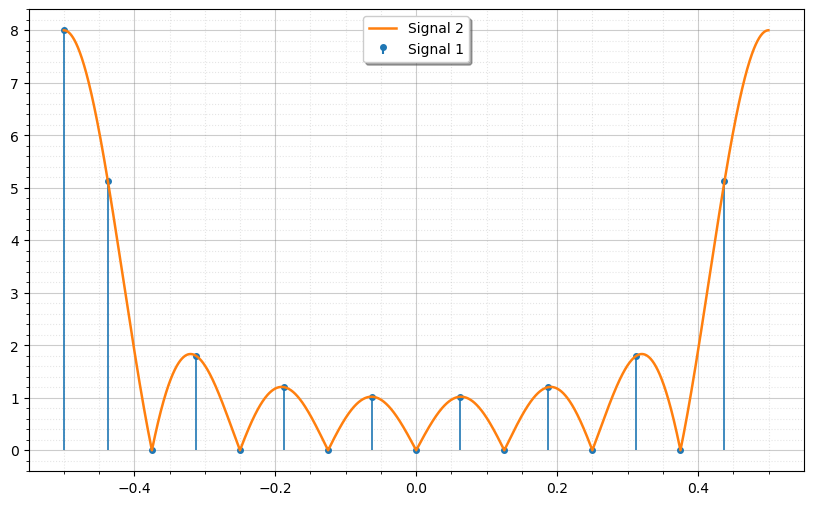

In [66]:
N=8
N_dtft=4096
x_arr = np.ones(8) * 1
nu_vec, spec = compute_dtft_analysis(x_arr, dtft_points=N*2, plot_results=False, as_stem=True, should_shift=False)
nu_vec_cont, spec_cont = compute_dtft_analysis(x_arr, dtft_points=N_dtft, plot_results=False, as_stem=True, should_shift=False)

nu_vec = np.fft.fftshift(nu_vec)
nu_vec_cont = np.fft.fftshift(nu_vec_cont)

plot_signals([np.abs(spec), np.abs(spec_cont)], [nu_vec, nu_vec_cont], as_stem=[True, False])

# Занятие 1. ДПФ и спектральный анализ.

## Задача 1.1.  Частотная ось ДПФ.

| Варианты: |       1      |     2     |         3        |      4     |        5        |        6       |
|:---------:|:------------:|:---------:|:----------------:|:----------:|:---------------:|:--------------:|
| **Имя файла** | 'cello1.wav' | 'cello2.wav' | 'glockenspiel.wav' | 'vibraphone1.wav' | 'clarinet.wav' | 'guitar.wav' |

| Варианты: |       7      |     8     |         9        |      10     |        11        |        12       |
|:---------:|:------------:|:---------:|:----------------:|:----------:|:---------------:|:--------------:|
| **Имя файла** | 'cello3.wav' | 'cello4.wav' | 'tuning-fork.wav' | 'vibraphone2.wav' | 'flute.wav' | 'wine-glass.wav' |




Считайте отсчеты дискретного сигнала $x[k]$, содержащегося в аудиофайле Вашего варианта. 

1) Выберите $y[k]$ — часть информативной области сигнала $x[k]$ длиной $2^{14}$ отсчетов. Если в файле меньше $2^{14}$ отсчетов, дополните ее нулями до этого числа отчетов справа.  

2) Постройте с помощью алгоритма БПФ один период ДВПФ сигнала $y[k]$. Укажите расстояние между точками по оси частот. Ось частот приведите в Гц. Определите по графику частоты основных гармонических компонент. 

3) выведите график сигнала $y[k]$ в области, где наблюдается колебание. По графику оцените период этого колебания $T_0$. Сравните частоту $f_0=1/ T_0$ с частотами основных гармоник из п.2.




**Файл:** `'vibraphone2.wav'`
Считаем файл, вырежем $2^{14}$ отсчетов информативной части (дополним нулями, если не хватает) и построим ДВПФ (спектр) в Гц.

In [2]:
# 1. Чтение файла и выделение фрагмента y[k]
fs, audio_data = wavfile.read('dataset_lab3_/vibraphone2.wav')

print(f"ndim: {audio_data.ndim}")

if audio_data.ndim > 1:
    audio_data = audio_data[:, 0] # берем один канал
    
Audio('./dataset_lab3_/vibraphone2.wav')

ndim: 1


In [3]:
print(f"audio_data.shape = {audio_data.shape}")
print(f"2**14 = {2**14}")

total_points = audio_data.shape[0]


audio_data.shape = (249376,)
2**14 = 16384


In [8]:
N_y = 2**14  # total_points
# Берем кусок, где есть звук
start_idx = 0
y = audio_data[start_idx : start_idx + N_y]
if len(y) < N_y:
    y = np.pad(y, (0, N_y - len(y)))


In [13]:

sd.play(y)
sd.wait()

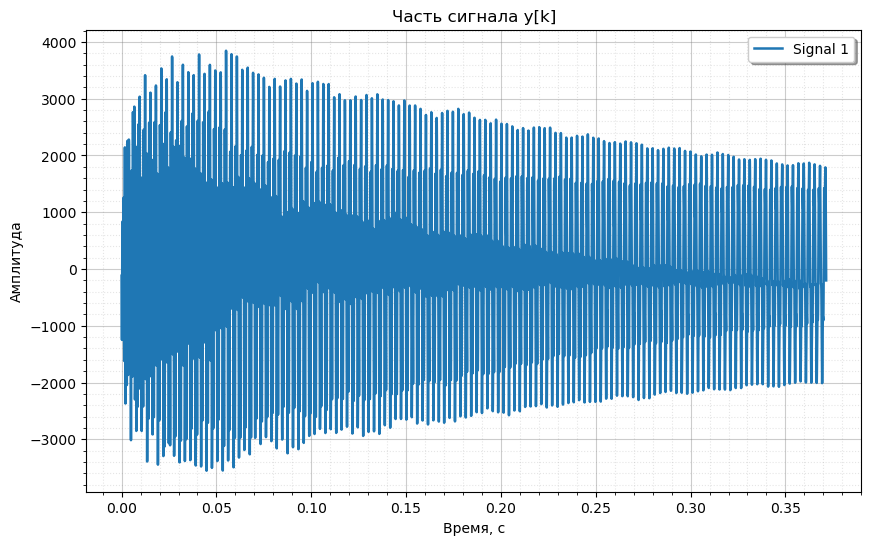

In [10]:
# Отрисовка фрагмента во времени
t_y_arr = np.arange(N_y) / fs
plot_signals(y, x=t_y_arr, xlabel="Время, с", ylabel="Амплитуда", title="Часть сигнала y[k]")

In [14]:
# 2. Вычисление спектра (ДВПФ через БПФ большого размера)
Nfft = max(sfft.next_fast_len(len(y)), 2**19)
freqs = sfft.fftshift(sfft.fftfreq(Nfft)) * fs
Xf = sfft.fftshift(sfft.fft(y / fs, Nfft))

df = fs / Nfft
print(f"Расстояние между точками по оси частот: {df:.4f} Гц")

Расстояние между точками по оси частот: 0.0841 Гц


Частоты: [-1404.87327576  -351.42860413   351.42860413  1404.87327576]
Значения: [209.17187684 301.46185007 301.46185007 209.17187684]


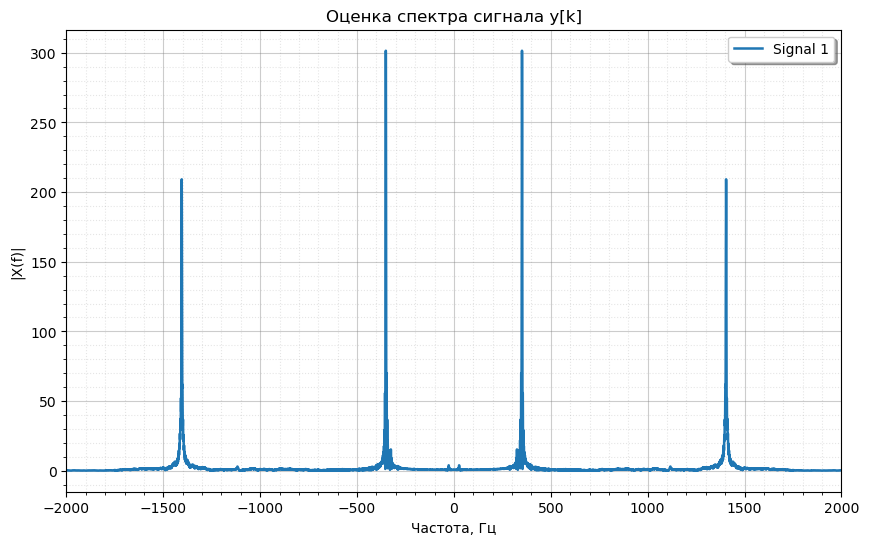

In [22]:
Fmax = 2000
use_dB = False

if use_dB:
    limits = (1e-3, 1e3)
else: 
    limits = None
    
peaks = sg.find_peaks(np.abs(Xf), height=100)

print(f"Частоты: {freqs[peaks[0]]}")
print(f"Значения: {peaks[1]["peak_heights"]}")

# Отрисовка спектра (ограничим до 2000 Гц для наглядности)
plot_signals(np.abs(Xf), x=freqs, 
             xlabel="Частота, Гц", ylabel="|X(f)|", 
             title="Оценка спектра сигнала y[k]", 
             limits=((-Fmax, Fmax), limits), log_scale=(False, use_dB))


Из графика спектра видим отчетливые пики. Основные частоты лежат в районе 2000 Гц (плюс есть высшие гармоники).

Построим увеличенный фрагмент самого колебания, чтобы оценить период $T_0$ визуально.

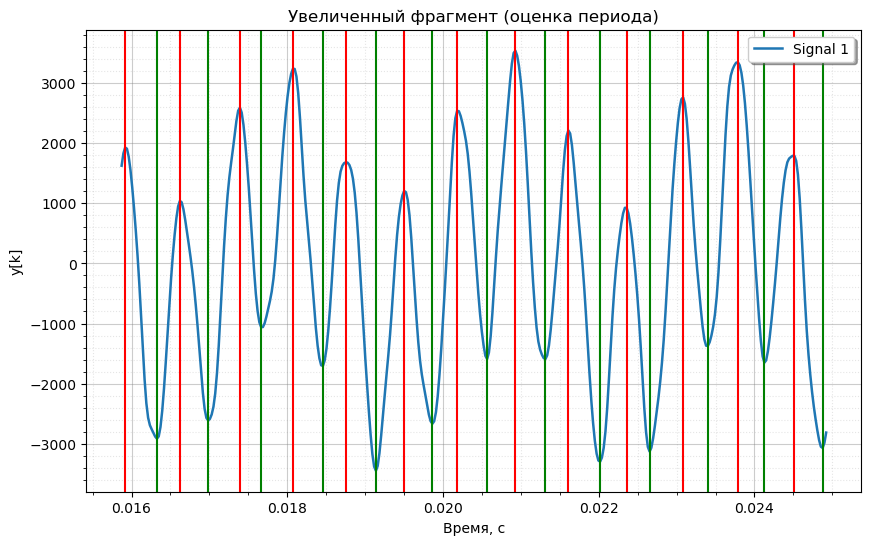

In [27]:
# 3. Визуальная оценка периода
zoom_samples = 400
start_zoom_idx = 700

y_zoomed = y[start_zoom_idx:start_zoom_idx + zoom_samples]
t_y_arr_zoomed = t_y_arr[start_zoom_idx:start_zoom_idx + zoom_samples]

plot_signals(y=y_zoomed, x=t_y_arr_zoomed,
             xlabel="Время, с", ylabel="y[k]", 
             title="Увеличенный фрагмент (оценка периода)", as_stem=False)

peaks_high = sg.find_peaks(y_zoomed, height=100)

for line_x_cord in t_y_arr_zoomed[peaks_high[0]]:
    plt.axvline(line_x_cord, color='red')
    
peaks_low = sg.find_peaks(-y_zoomed, height=100)

for line_x_cord in t_y_arr_zoomed[peaks_low[0]]:
    plt.axvline(line_x_cord, color='green')

In [9]:
peaks_high_t_idx_arr = peaks_high[0]

T0_est = (t_y_arr_zoomed[peaks_high_t_idx_arr[-1]] - t_y_arr_zoomed[peaks_high_t_idx_arr[0]]) / (len(peaks_high_t_idx_arr) - 1)
f0_est = 1 / T0_est

print(f"Оцененный период T0 ≈ {T0_est*1e3:.2f} мc")
print(f"Оцененная частота f0 = 1/T0 ≈ {f0_est:.1f} Гц")
print("Она совпадает с одним из крупных пиков из графика спектра выше.")

Оцененный период T0 ≈ 0.71 мc
Оцененная частота f0 = 1/T0 ≈ 1403.7 Гц
Она совпадает с одним из крупных пиков из графика спектра выше.


## Задача 1.2. Задача распознавания спектральных компонент. 

Считайте последовательность $x[k]$ из файла Вашего варианта (`variant_Nv_ex_1_2.npy`, где `Nv` — номер варианта). Известно, что ее аналитическая запись  имеет вид 

$$x[k]=\sum\limits_{m=1}^{M}{{{A}_{m}}}\sin (2\pi \frac{m}{N}k+{{\varphi }_{m}}),\quad k=0,\ 1,\ 2,\ \ldots ,\ N-1,$$


где $N$ — длина последовательности, $M<(N-1)/2$, относительные частоты гармонических компонент совпадают с бинами ДПФ. Определите число компонент,  их амплитуды ${{A}_{m}}$ и фазы ${{\varphi }_{m}}$, $m=1,\dots, M$.


### Задача 1.2. Распознавание спектральных компонент.

Загрузим последовательность `variant_10_ex_1_2.npy`. Вычислим ДПФ и найдем параметры неизвестных гармоник (амплитуды, фазы).

In [10]:
x_12 = np.load('dataset_lab3_/variant_10_ex_1_2.npy')
N_12 = len(x_12)

print(f"x_12 = {x_12}")
print(f"N_12 = {N_12}")

# Вычисляем ДПФ с нормировкой
X_n = np.fft.fft(x_12) / N_12


x_12 = [ -9.32709171  -0.08309657   7.12459388  -8.54238975   4.56551576
   3.81253368 -11.54930547   9.69215178   4.03458962 -17.00198913
  12.59677629   8.01956823 -22.33704585  11.56012114  14.20872264
 -24.93606762   6.62132034  19.96642065 -23.31553746  -0.44190753
  22.78119674 -17.80392891  -6.9212745   21.4116537  -10.39855066
 -10.4070956   16.4566841   -3.8669898   -9.88043155  10.09080977
  -0.50087348  -6.17228158   5.08445102  -1.08744536  -1.58131669
   3.55357207  -4.56551576   1.176284     6.00602827  -8.52160985
   0.20805106  11.11727745 -10.3006757   -4.68614683  16.33704585
  -8.22669975 -11.91262205  19.05135594  -2.37867966 -18.79587872
  17.77226026   5.4307252  -22.78119674  12.81511123  12.4645517
 -22.58219564   6.15590997  16.29180729 -18.75278469   0.5335684
  15.88043155 -13.42423117  -1.79522711  12.05699326]
N_12 = 64


Найдено компонент: 6
Бин m=19: Амплитуда A=9, Фаза phi=120°
Бин m=21: Амплитуда A=15, Фаза phi=-90°
Бин m=22: Амплитуда A=3, Фаза phi=225°
Бин m=42: Амплитуда A=3, Фаза phi=-45°
Бин m=43: Амплитуда A=15, Фаза phi=270°
Бин m=45: Амплитуда A=9, Фаза phi=60°


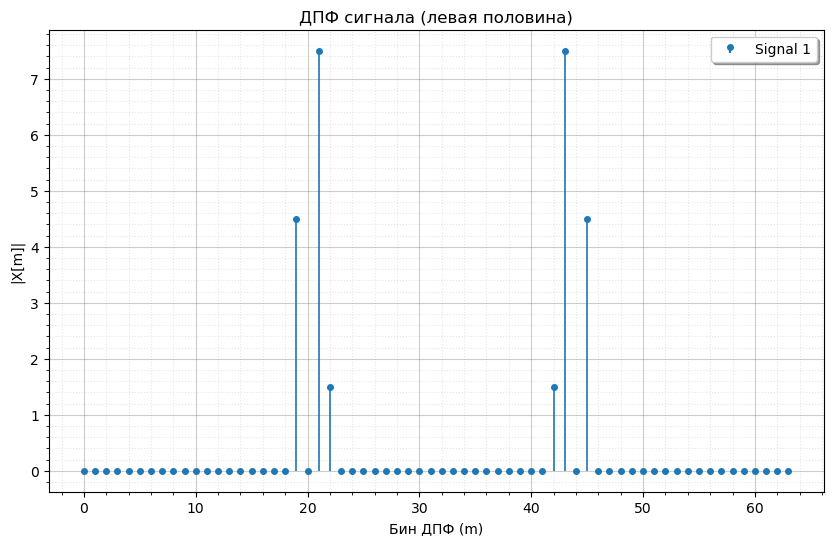

In [11]:
# Отрисуем амплитудный спектр ДПФ
plot_signals(np.abs(X_n),
             xlabel="Бин ДПФ (m)", ylabel="|X[m]|", 
             title="ДПФ сигнала (левая половина)", as_stem=True)

# Ищем значимые компоненты (порог)
threshold = 1e-3
peaks_idx = np.where(np.abs(X_n) > threshold)[0]

print(f"Найдено компонент: {len(peaks_idx)}")
for m in peaks_idx:
    A_m = 2 * np.abs(X_n[m])
    phi_m = (np.angle(X_n[m]) + np.pi/2) * 180 / np.pi
    print(f"Бин m={m}: Амплитуда A={A_m:.0f}, Фаза phi={phi_m:.0f}°")

# Занятие 2. Окна в спектральном анализе.

## Задача 2.1. Исследование характеристик различных окон.
Рассмотрите следующие окна для ДПФ длиной в $N=20+2N_v$, где $N_v $ — номер Вашего варианта:

1) прямоугольное (`boxcar`),

2) Бартлетта (`bartlett`),

3) Ханна (`hann`),

4) Хэмминга (`hamming`),

5) Блэкмана (`blackman`),

6) окно с плоской вершиной (`flattop`).

Постройте графики для окон во временной области, амплитудно-частотной характеристики окон в линейном масштабе и в дБ. По графикам для каждого окна оцените следующие параметры:

* ширину $\Delta \nu$ главного лепестка на уровне половинной мощности,

* максимальный уровень боковых лепестков относительно главного в дБ,

* асимптотическую скорость спада боковых лепестков в дБ/октава. 

Составьте таблицу с результатами. 


**Вариант 10:** $N = 20 + 2 \times 10 = 40$.

Сформируем окна, построим их во времени и проанализируем АЧХ. Сведем оценки в таблицу.

In [12]:
N_win = 40
windows = \
[
    'boxcar',
    'bartlett', 
    'hann', 
    'hamming', 
    'blackman', 
    'flattop',
    
]
w_list = [sg.get_window(w, N_win) for w in windows]

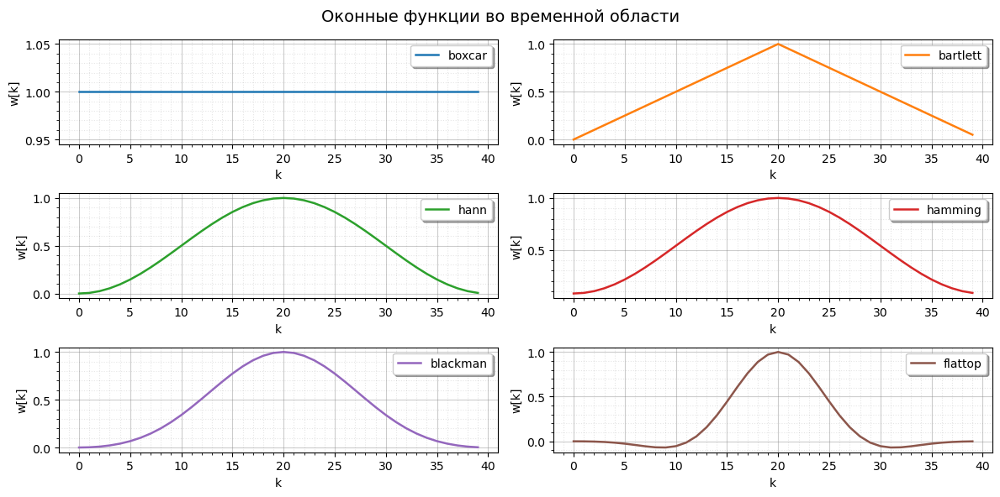

In [13]:
# Во временной области
plot_signals(w_list, labels=windows,
             xlabel="k", ylabel="w[k]", title="Оконные функции во временной области", use_subplots=True, figsize=(12,6), subplots_cols=2)

In [14]:
w_list = [sg.get_window(w, N_win) for w in windows]

# В частотной области (АЧХ)
nu_vec, W_dtft_list = compute_dtft_analysis(w_list, dtft_points=4096)
# Нормировка на сумму (чтобы максимум был в 0 дБ)
W_dtft_list = [W / np.sum(w) for W, w in zip(W_dtft_list, w_list)]

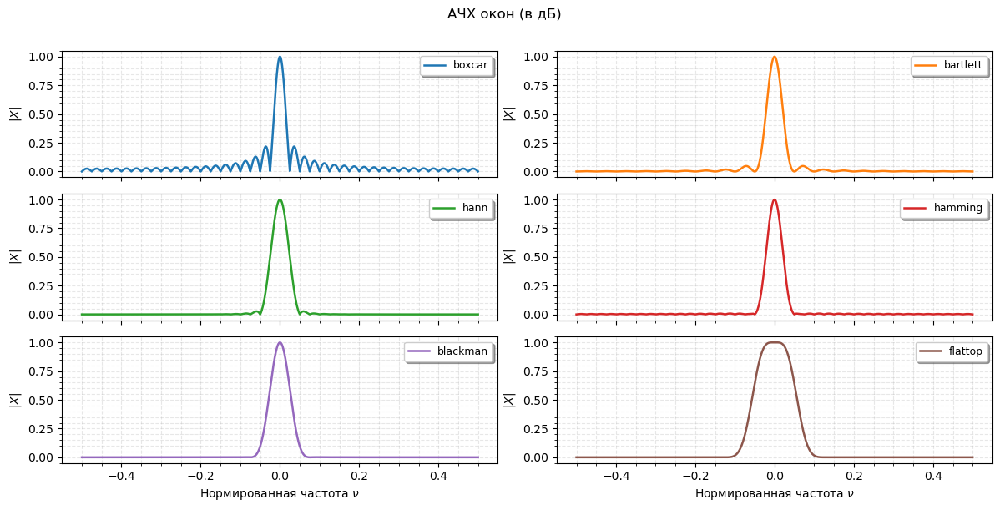

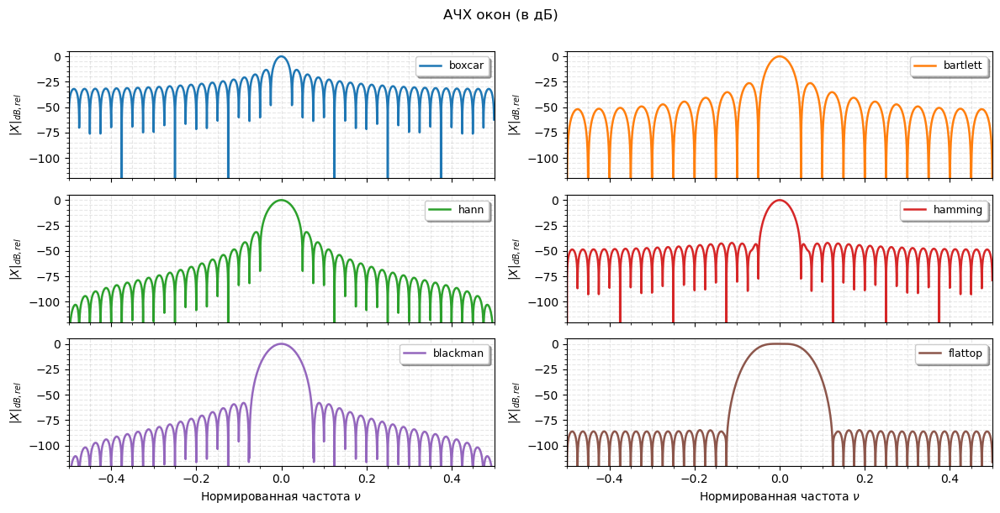

In [15]:
plot_dtft_analysis(nu_vec, W_dtft_list, labels=windows, use_db=False, 
                #    limits=((-0.5, 0.5), (-120, 5)), 
                   title="АЧХ окон (в дБ)",
                   figsize=(12,6),
                   use_subplots=True,
                   subplots_cols=2)

plt.show()

plot_dtft_analysis(nu_vec, W_dtft_list, labels=windows, use_db=True, 
                   limits=((-0.5, 0.5), (-120, 5)), 
                   title="АЧХ окон (в дБ)",
                   figsize=(12,6),
                   use_subplots=True,
                   subplots_cols=2,
                   db_relative=True)

In [16]:
data = []

# Находим индексы для частот 0.2 и 0.4 (разница ровно в одну октаву)
idx1, idx2 = np.searchsorted(nu_vec, [0.2, 0.4])

for name, W in zip(windows, W_dtft_list):
    W_db = 20 * np.log10(np.clip(np.abs(W), 1e-10, None))
    # Ширина главного лепестка по уровню -3 дБ
    main_lobe_idx = np.where(W_db >= -3.0)[0]
    delta_nu = nu_vec[main_lobe_idx[-1]] - nu_vec[main_lobe_idx[0]]
    
    # Макс. боковой лепесток
    peaks, _ = sg.find_peaks(W_db)
    peaks = [p for p in peaks if np.abs(nu_vec[p]) > delta_nu/2]
    max_sl = W_db[peaks[np.argmax(W_db[peaks])]] if len(peaks) > 0 else -100
    
    # Спад в дБ на октаву
    decay_rate = W_db[idx2] - W_db[idx1]
    
    data.append({
        "Окно": name,
        "Δν (-3 дБ) в бинах ДПФ"   : round(delta_nu * N_win, 4), 
        "Макс. БЛ (дБ)": round(max_sl, 1), 
        "Спад (дБ/окт)": round(decay_rate, 1)
    })

df_windows = pd.DataFrame(data)
display(df_windows)

,Окно,Δν (-3 дБ) в бинах ДПФ,Макс. БЛ (дБ),Спад (дБ/окт)
0,boxcar,0.8789,-13.2,-6.7
1,bartlett,1.2695,-26.4,-13.3
2,hann,1.4258,-31.5,-23.5
3,hamming,1.2891,-42.1,-6.1
4,blackman,1.6406,-58.1,-22.9
5,flattop,3.7109,-84.9,-3.5


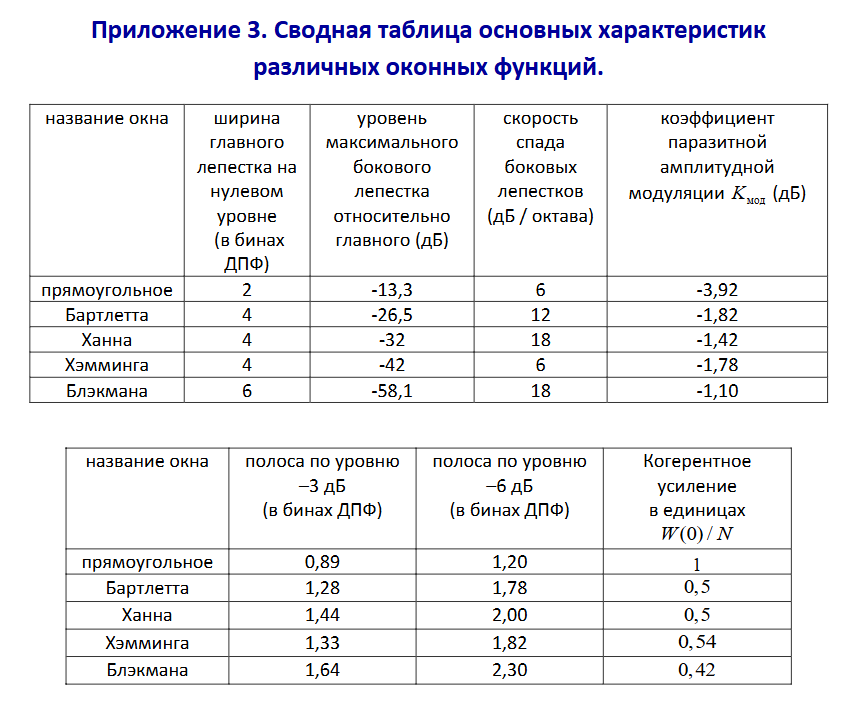

*Вывод:* Чем меньше уровень боковых лепестков (Blackman, Flattop), тем шире главный лепесток. Прямоугольное окно (Boxcar) дает самое высокое разрешение (узкий главный лепесток), но ужасные боковые лепестки (-13 дБ).

## Задача 2.2. Окно Кайзера.
Повторите вычисления задачи 2.1 для окна Кайзера с параметром $\beta =0;\ \ 5;\ \ 6;\ \ 8,6$. Сравните полученные результаты с предыдущей задачей. 


In [17]:
N_win = 40
kaiser_betas = [0, 5, 6, 8.6]
labels_kaiser = [f"Kaiser (β={b})" for b in kaiser_betas]
w_kaiser = [sg.windows.kaiser(N_win, b) for b in kaiser_betas]

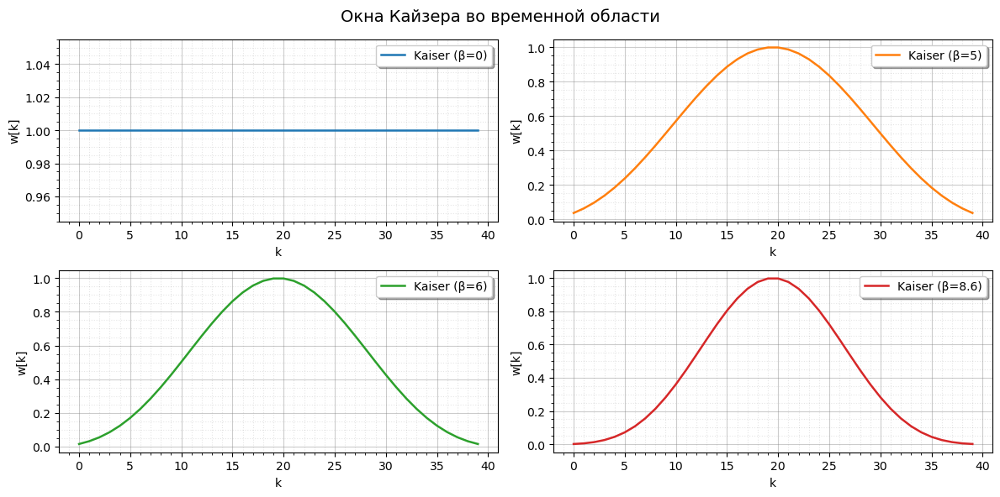

In [18]:
# Во временной области
plot_signals(w_kaiser, labels=labels_kaiser,
             xlabel="k", ylabel="w[k]", title="Окна Кайзера во временной области", 
             use_subplots=True, figsize=(12, 6), subplots_cols=2)

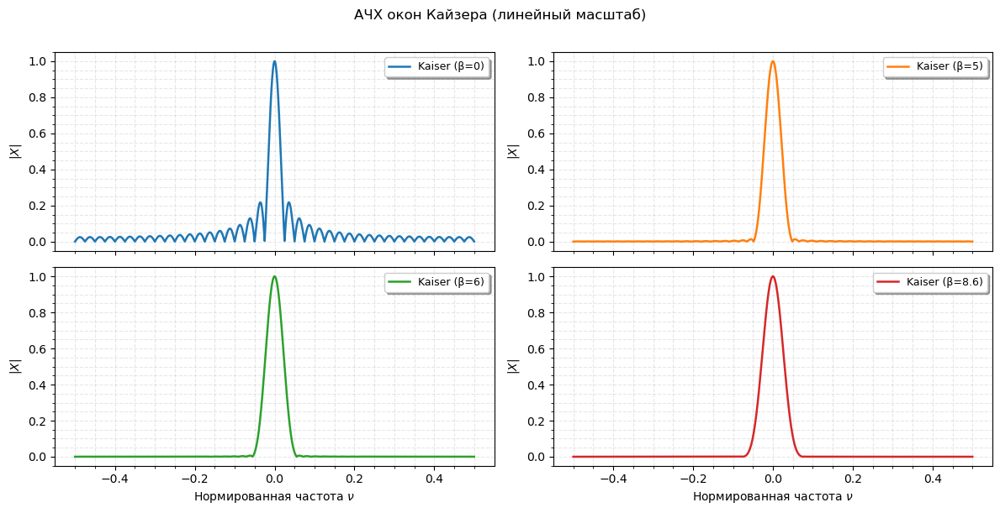

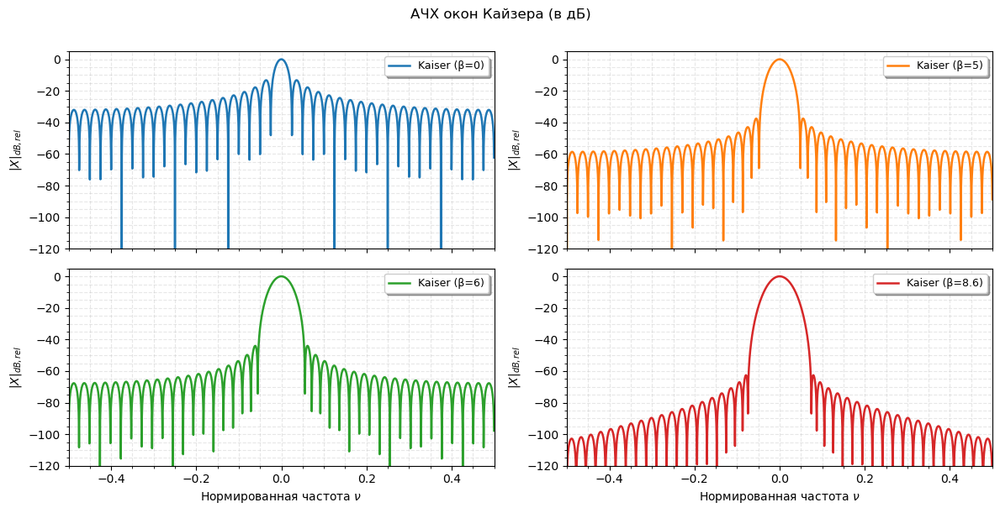

In [19]:

# В частотной области (АЧХ)
nu_vec, W_kaiser_dtft = compute_dtft_analysis(w_kaiser, dtft_points=4096)

# Нормировка
W_kaiser_dtft = [W / np.sum(w) for W, w in zip(W_kaiser_dtft, w_kaiser)]

plot_dtft_analysis(nu_vec, W_kaiser_dtft, labels=labels_kaiser, use_db=False, 
                   title="АЧХ окон Кайзера (линейный масштаб)",
                   figsize=(12, 6), use_subplots=True, subplots_cols=2)

plot_dtft_analysis(nu_vec, W_kaiser_dtft, labels=labels_kaiser, use_db=True, 
                   limits=((-0.5, 0.5), (-120, 5)), 
                   title="АЧХ окон Кайзера (в дБ)",
                   figsize=(12, 6), use_subplots=True, subplots_cols=2, db_relative=True)

In [20]:
data_kaiser = []
kaiser_max_sl = [] # Сохраним уровни боковых лепестков для задачи 2.3

# Находим индексы для частот 0.2 и 0.4 (разница ровно в одну октаву)
idx1, idx2 = np.searchsorted(nu_vec, [0.2, 0.4])

for name, W in zip(labels_kaiser, W_kaiser_dtft):
    W_db = 20 * np.log10(np.clip(np.abs(W), 1e-10, None))
    # Ширина главного лепестка по уровню -3 дБ
    main_lobe_idx = np.where(W_db >= -3.0)[0]
    delta_nu = nu_vec[main_lobe_idx[-1]] - nu_vec[main_lobe_idx[0]]
    
    # Макс. боковой лепесток
    peaks, _ = sg.find_peaks(W_db)
    peaks = [p for p in peaks if np.abs(nu_vec[p]) > delta_nu/2]
    max_sl = W_db[peaks[np.argmax(W_db[peaks])]] if len(peaks) > 0 else -100
    kaiser_max_sl.append(abs(max_sl)) # Запоминаем затухание (модуль)
    
    # Спад в дБ на октаву
    decay_rate = W_db[idx2] - W_db[idx1]
    
    data_kaiser.append({
        "Окно": name,
        "Δν (-3 дБ) в бинах ДПФ"   : round(delta_nu * N_win, 4), 
        "Макс. БЛ (дБ)": round(max_sl, 1), 
        "Спад (дБ/окт)": round(decay_rate, 1)
    })

df_kaiser = pd.DataFrame(data_kaiser)
display(df_kaiser)

,Окно,Δν (-3 дБ) в бинах ДПФ,Макс. БЛ (дБ),Спад (дБ/окт)
0,Kaiser (β=0),0.8789,-13.2,-6.7
1,Kaiser (β=5),1.3281,-37.5,-17.6
2,Kaiser (β=6),1.4258,-44.0,-16.9
3,Kaiser (β=8.6),1.6602,-62.6,-13.2


*Вывод:* Окно Кайзера при $\beta=0$ полностью эквивалентно прямоугольному окну (Boxcar). При увеличении параметра $\beta$ максимальный уровень боковых лепестков стремительно уменьшается, но за это приходится платить расширением главного лепестка (разрешающая способность падает). Окно позволяет гибко балансировать между шириной главного лепестка и подавлением боковых.

## Задача 2.3. Окно Чебышева.
Получите окно Чебышева для четырех уровней боковых лепестков, которые получились в задаче 2.2. Сравните ширину главного лепестка на уровне половинной мощности с результатами предыдущих задач. 


In [21]:
kaiser_max_sl

[np.float64(13.244174087018335),
 np.float64(37.542732264291),
 np.float64(44.030150488397915),
 np.float64(62.621579696533786)]

In [22]:
labels_cheb = [f"Chebyshev (at={round(sl, 1)} дБ)" for sl in kaiser_max_sl]

# Параметр at для Чебышева — это требуемое подавление боковых лепестков в дБ.
# Берем значения kaiser_max_sl, вычисленные в предыдущей ячейке.
w_cheb = [sg.windows.chebwin(N_win, at=sl) for sl in kaiser_max_sl]

C:\Users\Skifv\AppData\Local\Temp\ipykernel_12184\4251685552.py:5: UserWarning: This window is not suitable for spectral analysis for attenuation values lower than about 45dB because the equivalent noise bandwidth of a Chebyshev window does not grow monotonically with increasing sidelobe attenuation when the attenuation is smaller than about 45 dB.
  w_cheb = [sg.windows.chebwin(N_win, at=sl) for sl in kaiser_max_sl]


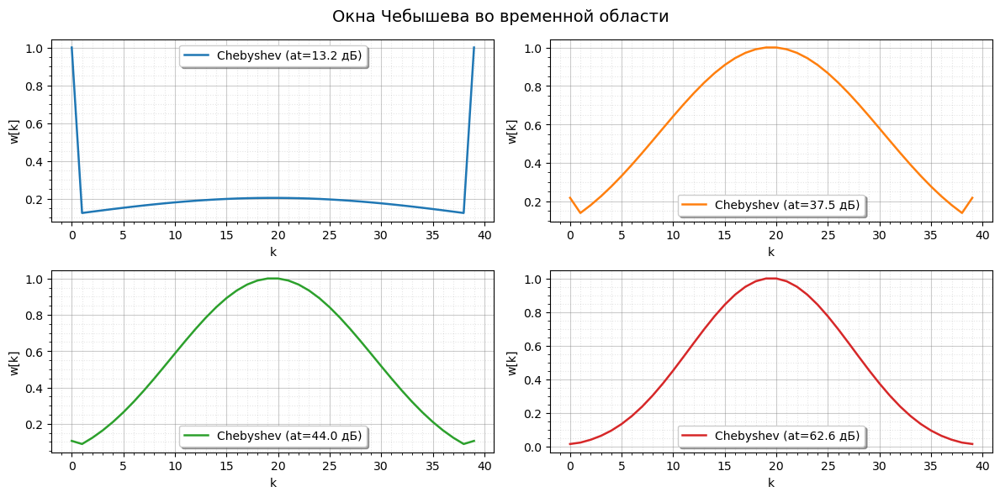

In [23]:
# Во временной области
plot_signals(w_cheb, labels=labels_cheb,
             xlabel="k", ylabel="w[k]", title="Окна Чебышева во временной области", 
             use_subplots=True, figsize=(12, 6), subplots_cols=2)

In [24]:
# В частотной области (АЧХ)
nu_vec, W_cheb_dtft = compute_dtft_analysis(w_cheb, dtft_points=4096)

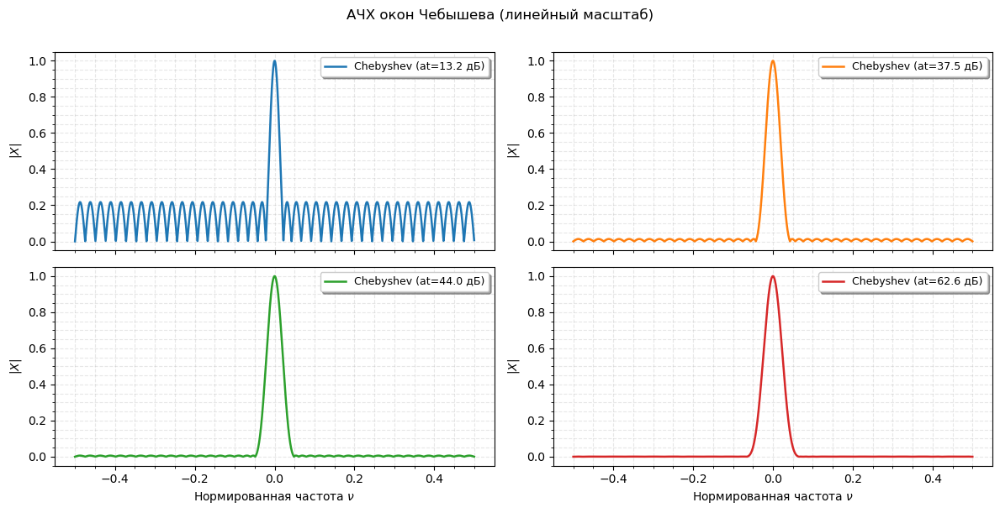

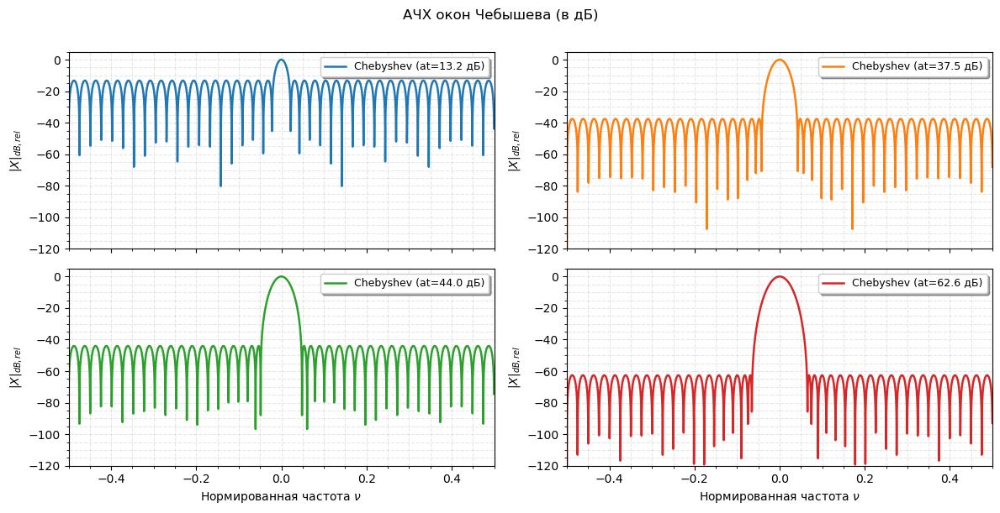

In [25]:
# Нормировка
W_cheb_dtft = [W / np.sum(w) for W, w in zip(W_cheb_dtft, w_cheb)]

plot_dtft_analysis(nu_vec, W_cheb_dtft, labels=labels_cheb, use_db=False, 
                   title="АЧХ окон Чебышева (линейный масштаб)",
                   figsize=(12, 6), use_subplots=True, subplots_cols=2)

plot_dtft_analysis(nu_vec, W_cheb_dtft, labels=labels_cheb, use_db=True, 
                   limits=((-0.5, 0.5), (-120, 5)), 
                   title="АЧХ окон Чебышева (в дБ)",
                   figsize=(12, 6), use_subplots=True, subplots_cols=2, db_relative=True)

In [26]:
data_cheb = []

for name, W in zip(labels_cheb, W_cheb_dtft):
    W_db = 20 * np.log10(np.clip(np.abs(W), 1e-10, None))
    # Ширина главного лепестка по уровню -3 дБ
    main_lobe_idx = np.where(W_db >= -3.0)[0]
    delta_nu = nu_vec[main_lobe_idx[-1]] - nu_vec[main_lobe_idx[0]]
    
    # Макс. боковой лепесток
    peaks, _ = sg.find_peaks(W_db)
    peaks = [p for p in peaks if np.abs(nu_vec[p]) > delta_nu/2]
    max_sl = W_db[peaks[np.argmax(W_db[peaks])]] if len(peaks) > 0 else -100
    
    # Спад в дБ на октаву
    decay_rate = W_db[idx2] - W_db[idx1]
    
    data_cheb.append({
        "Окно": name,
        "Δν (-3 дБ) в бинах ДПФ"   : round(delta_nu * N_win, 4), 
        "Макс. БЛ (дБ)": round(max_sl, 1), 
        "Спад (дБ/окт)": round(decay_rate, 1)
    })

df_cheb = pd.DataFrame(data_cheb)
display(df_cheb)

,Окно,Δν (-3 дБ) в бинах ДПФ,Макс. БЛ (дБ),Спад (дБ/окт)
0,Chebyshev (at=13.2 дБ),0.7812,-13.2,-8.0
1,Chebyshev (at=37.5 дБ),1.1719,-37.5,-6.9
2,Chebyshev (at=44.0 дБ),1.2695,-44.0,-5.6
3,Chebyshev (at=62.6 дБ),1.4844,-62.6,-7.0


*Вывод:* Окно Чебышева обладает уникальным свойством — все его боковые лепестки имеют одинаковый уровень (равноволновые колебания в полосе подавления), поэтому скорость асимптотического спада близка к 0 дБ/октава. 

По сравнению с окном Кайзера (при одинаковом максимальном уровне боковых лепестков), окно Чебышева дает **наименьшую возможную ширину главного лепестка**, что делает его теоретически оптимальным для достижения максимального частотного разрешения при заданном подавлении шума.

## Задача 2.4. Различимость спектральных компонент.

| Варианты: | 1 | 2 | 3 | 4 | 5 | 6 | 7 | 8 | 9 | 10 | 11 | 12 |
|:--:|:--:|:--:|:--:|:--:|:--:|:--:|:--:|:--:|:--:|:--:|:--:|:--:|
|$n_0$|11 | 15 | 18 | 17 | 32 | 48 | 15 | 18 | 47 | 32 | 40 | 38 |
|$\beta_0$| 1.1| 1.5 | 1.2 | 1.5 | 1.1 | 1.3 | 1.1 | 1.4 | 1.5 | 1.3 | 1.2 | 1.1 |
|$\beta_1$| 5 | 5.5 | 6.2 | 5.7 | 6.1 | 4.9 | 5.1 | 5.7 | 6 | 5.8 | 5.7 | 5.5 |

Произведите спектральный анализ с помощью ДПФ размерности $M=2048$ последовательности 
$$x[k]=\cos\left(2\pi \dfrac{n_0}{128} k\right)+ \cos\left(2\pi \dfrac{n_0+2}{128} k\right)$$
 со взвешиванием следующими оконными функциями длиной 128 отчетов:
 
 а) окном Кайзера с параметром $\beta=\beta_0.$,

 б) окном Кайзера с параметром $\beta=\beta_1.$
 
 в) окном Блэкмана.
 
Значения параметров $n_0$ и $\beta=\beta_1$ определите из таблицы. Ответьте на следующие вопросы.
 
1) Для каких оконных функций гармонические компоненты оказались различимы и почему?

2) Как влияет максимальный уровень боковых лепестков оконной функции на результат спектрального анализа? 


**Вариант 10:** $n_0 = 32$, $\beta_0 = 1.3$, $\beta_1 = 5.8$. Длина окна: 128, ДПФ: $M=2048$.

In [27]:
N_sig = 128
n0 = 32
k_sig = np.arange(N_sig)
x_24 = np.cos(2 * np.pi * n0 / 128 * k_sig) + np.cos(2 * np.pi * (n0 + 2) / 128 * k_sig)

beta0, beta1 = 1.3, 5.8
win_24 = [
    sg.windows.kaiser(N_sig, beta0),
    sg.windows.kaiser(N_sig, beta1),
    sg.windows.blackman(N_sig)
]
labels_24 = [rf"Kaiser $\beta$={beta0}", rf"Kaiser $\beta$={beta1}", "Blackman"]

In [28]:
y_24 = [x_24 * w for w in win_24]
nu_24, spec_24 = compute_dtft_analysis(y_24, dtft_points=2048)
spec_24 = [s / np.sum(w) for s, w in zip(spec_24, win_24)]

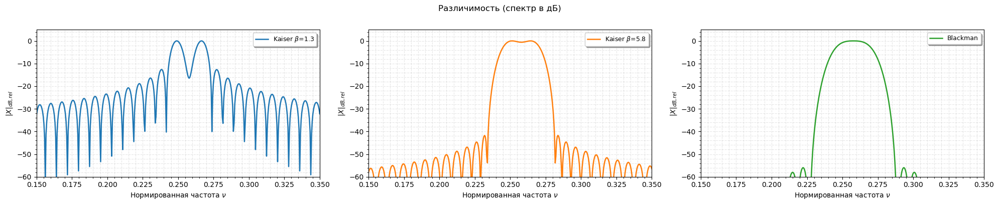

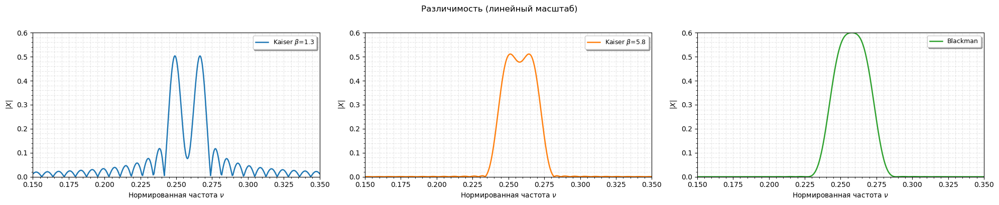

In [29]:

plot_dtft_analysis(nu_24, spec_24, labels=labels_24, use_db=True,
                   limits=((0.15, 0.35), (-60, 5)), 
                   title="Различимость (спектр в дБ)",
                   figsize=(20,4),
                   use_subplots=True,
                   subplots_cols=3,
                   db_relative=True)

plot_dtft_analysis(nu_24, spec_24, labels=labels_24, use_db=False,
                   limits=((0.15, 0.35), (0, 0.6)), 
                   title="Различимость (линейный масштаб)",
                   figsize=(20,4),
                   use_subplots=True,
                   subplots_cols=3,)

1. **Для каких окон компоненты различимы?** Различимы для `Kaiser β=1.3, 5.8`. Blackman сливает компоненты в один горб, так как его главный лепесток шире расстояния между частотами.
2. **Влияние боковых лепестков:** Высокие боковые лепестки могут маскировать соседние слабые сигналы, но занижение БЛ приводит к расширению главного лепестка (теряем разрешение по частоте)

## Задача 2.5. Маскировка слабой гармоники боковыми лепестками окна.


| Варианты: |       1      |     2     |         3        |      4     |        5        |        6       |
|:---------:|:------------:|:---------:|:----------------:|:----------:|:---------------:|:--------------:|
| $w_1[k]$ | Бартлетта | Ханна | Хэмминга | Ханна | Бартлетта | Хэмминга |
| $m_2$ |    -2     |     2    |   -2    |     2    |   -2    |     2    |
| $m_3$ |     4     |     6    |    3    |     4    |    5    |     7    |


| Варианты: |       7      |     8     |         9        |      10     |        11       |        12       |
|:---------:|:------------:|:---------:|:----------------:|:----------:|:---------------:|:--------------:|
| $w_1[k]$ | Хэмминга | Ханна | Бартлетта | Ханна | Хэмминга | Бартлетта |
| $m_2$ |      2     |   -2    |     2    |   -2    |     2    |   -2    |
| $m_3$ |      7     |    3    |    -3    |   -4    |     5    |    4    |

Сгенерировать последовательность отсчетов гармонического сигнала $x[k]$ длительностью $N=64$, которая может быть описана следующей формулой:
$$x[k]=a_1 \sin\left(2\pi k \frac{n}{N}\right) + a_2 \cos\left(2\pi k \frac{n+m_2}{N}\right) - a_3\sin\left(2\pi k \frac{n+m_3}{N}\right),$$
где $a_1 = n = n_\text{v}+10$ ($n_\text{v}$ — номер вашего варианта), $a_2 = \dfrac{a_1}{6}$, $a_3 = \dfrac{a_1}{2}$, $m_2$  и  $m_3$  значения из таблицы, соответствующие вашему варианту.

* Построить ДВПФ $x[k]$, применив прямоугольное окно. Сколько гармонических компонент можно выделить?

* Построить ДВПФ $x[k]$, применив окно Блэкмана. Какие гармонические компоненты наблюдаются теперь?

* Построить ДВПФ $x[k]$, используя окно $w_1[k]$ из вашего варианта. Получилось ли пронаблюдать все гармонические компоненты?

* Подобрать коэффициенты для окон Чебышева и Кайзера так, чтобы возможно было наблюдать все гармонические компоненты. Построить соответствующие графики.

**Вариант 10:** $w_1 =$ `hann`, $m_2 = -2$, $m_3 = -4$. $n=20$, $a_1=20$, $a_2=3.33$, $a_3=10$.

Сначала сгенерируем сигнал и посмотрим, как с его анализом справляются базовые окна (Прямоугольное, Блэкмана и Ханна). Выведем графики на отдельных осях для наглядного подсчета пиков.

In [30]:
N_25 = 64
k_25 = np.arange(N_25)

# Параметры из 10 варианта
n_25 = 20
a1 = 20
a2 = a1 / 6
a3 = a1 / 2
m2 = -2
m3 = -4

# Генерация сигнала
x_25 = (a1 * np.sin(2 * np.pi * k_25 * n_25 / N_25) 
        + a2 * np.cos(2 * np.pi * k_25 * (n_25 + m2) / N_25) 
        - a3 * np.sin(2 * np.pi * k_25 * (n_25 + m3) / N_25))

nu_arr = np.asarray([n_25 / N_25, (n_25+m2) / N_25, (n_25+m3)/N_25])

Теоретические частоты: ±20/64 = ±0.3125, ±18/64 = ±0.28125, ±16/64 = ±0.25


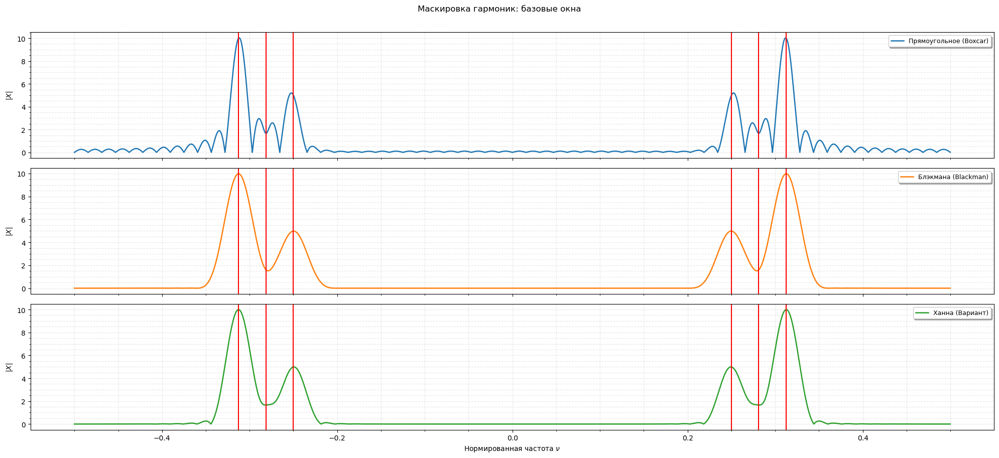

In [31]:

# 1. Исследование базовых окон
wins_base = [
    sg.windows.boxcar(N_25),
    sg.windows.blackman(N_25),
    sg.windows.hann(N_25) # Окно из варианта
]
labels_base = ["Прямоугольное (Boxcar)", "Блэкмана (Blackman)", "Ханна (Вариант)"]

y_base = [x_25 * w for w in wins_base]
nu_base, spec_base = compute_dtft_analysis(y_base, dtft_points=4096)
spec_base = [s / np.sum(w) for s, w in zip(spec_base, wins_base)]

# Отрисовка в логарифмическом масштабе, каждый график на своей оси
plot_dtft_analysis(nu_base, spec_base, labels=labels_base, use_db=False,
                #    limits=((0.15, 0.4), (-30, 30)), 
                   use_subplots=True, figsize=(20, 9),
                   title="Маскировка гармоник: базовые окна")

for subplot_idx in range (1, 4):
    for nu in nu_arr:
        plt.subplot(3, 1, subplot_idx)
        plt.axvline(nu, color='r')
        plt.axvline(-nu, color='r')
        
print(rf'Теоретические частоты: ±{n_25}/{N_25} = ±{nu_arr[0]}, ±{n_25+m2}/{N_25} = ±{nu_arr[1]}, ±{n_25+m3}/{N_25} = ±{nu_arr[2]}')

plt.show()

In [32]:
20*np.log10(np.abs(spec_base[0][np.searchsorted(nu_base, 0.3125)])) - 20*np.log10(np.abs(spec_base[0][np.searchsorted(nu_base, 0.2812)]))

np.float64(15.563025007672895)


1. **Прямоугольное окно (Boxcar):** Можно выделить **2 гармонические компоненты** (на частотах 0.25 и 0.3125). Самая слабая компонента ($a_2 \approx 3.33$, частота 0.2812) *замаскирована* высоким уровнем боковых лепестков самой мощной гармоники ($a_1=20$). Разница их амплитуд $\approx 15.6$ дБ, а прямоугольное окно подавляет боковые лепестки лишь на $13$ дБ.
2. **Окно Блэкмана:** Теперь наблюдаются тоже **только 2 пика**. У окна Блэкмана очень низкие боковые лепестки (-58 дБ), маскировки амплитудой нет. Но у него *слишком широкий главный лепесток*, поэтому близко расположенные гармоники (0.2812 и 0.3125) сливаются из-за нехватки частотного разрешения.
3. **Окно Ханна ($w_1$):** То же, что и для окна Блэкмана. Главный лепесток все еще слишком широк для данного расстояния между частотами, поэтому слабый пик сливается с мощным соседним.
 
---
Нужно найти "золотую середину": окно должно иметь подавление боковых лепестков не хуже **-20 дБ** (чтобы мощный сигнал не замаскировал слабый, разница между которыми 15.6 дБ), но при этом сохранять узкий главный лепесток. Идеально подойдут **окно Чебышева** и **окно Кайзера** с небольшими коэффициентами.

C:\Users\Skifv\AppData\Local\Temp\ipykernel_12184\2901895263.py:7: UserWarning: This window is not suitable for spectral analysis for attenuation values lower than about 45dB because the equivalent noise bandwidth of a Chebyshev window does not grow monotonically with increasing sidelobe attenuation when the attenuation is smaller than about 45 dB.
  sg.windows.chebwin(N_25, at=at),


Теоретические частоты: ±20/64 = ±0.3125, ±18/64 = ±0.28125, ±16/64 = ±0.25


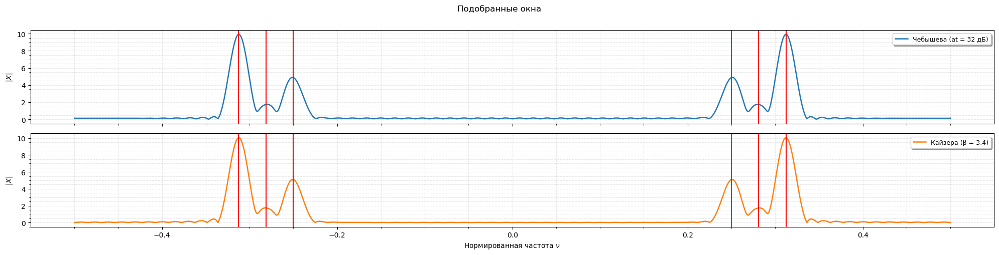

In [33]:
# for at in np.arange(15, 35, 1):
# for beta in np.arange(2.4, 3.5, 0.1):
at = 32
beta = 3.4

wins_opt = [
    sg.windows.chebwin(N_25, at=at),
    sg.windows.kaiser(N_25, beta=beta)
]
labels_opt = \
[
    f"Чебышева (at = {at} дБ)", 
    f"Кайзера (β = {beta})"
]

y_opt = [x_25 * w for w in wins_opt]
nu_opt, spec_opt = compute_dtft_analysis(y_opt, dtft_points=4096)
spec_opt = [s / np.sum(w) for s, w in zip(spec_opt, wins_opt)]

# Отрисовка в линейном масштабе для наглядной демонстрации трех пиков
plot_dtft_analysis(nu_opt, spec_opt, labels=labels_opt, use_db=False,
                #    limits=((0.15, 0.4), (0, 11)), 
                use_subplots=True, figsize=(20, 5),
                title="Подобранные окна")

for subplot_idx in range (1, 3):
    for nu in nu_arr:
        plt.subplot(2, 1, subplot_idx)
        plt.axvline(nu, color='r')
        plt.axvline(-nu, color='r')

print(rf'Теоретические частоты: ±{n_25}/{N_25} = ±{nu_arr[0]}, ±{n_25+m2}/{N_25} = ±{nu_arr[1]}, ±{n_25+m3}/{N_25} = ±{nu_arr[2]}')
plt.show()
            




## Задача 2.6. Амплитудная модуляция спектра.

| Варианты: | 1 | 2 | 3 | 4 | 5 | 6 | 7 | 8 | 9 | 10 | 11 | 12 |
|:--:|:--:|:--:|:--:|:--:|:--:|:--:|:--:|:--:|:--:|:--:|:--:|:--:|
|$n_0$|11,5 | 15,5 | 18,5 | 17,5 | 32,5 | 48,5 | 15,5 | 18,5 | 47,5 | 32,5 | 40,5 | 38,5 |

Произведите спектральный анализ с помощью ДПФ размерности $M=128$ последовательности 
$$x[k]=\cos\left(2\pi \dfrac{n_0}{128} k\right)$$
 со взвешиванием следующими оконными функциями длиной 128 отчетов:
 
 а) прямоугольным окном (`boxcar`),

 б) окном с плоской вершиной (`flattop`).
 
 
Значение параметра $n_0$ определите из таблицы. Отнормируйте ДПФ на значение АЧХ оконной функции на нулевой частоте ($W(0)=\sum_{k=0}^{N-1} w[k]$). Для двух окон сравните амплитуду гармоники с модулем ближайших к ней отсчетов ДПФ.

**Вариант 10:** $n_0 = 32.5$. $M = 128$.

Анализируем сигнал $x[k]=\cos\left(2\pi \dfrac{32.5}{128} k\right)$ взвешенный прямоугольным окном и окном с плоской вершиной (`flattop`).

Наблюдаем явление паразитной амплитудной модуляции: частота сигнала находится ровно между бинами ДПФ (32 и 33).

In [34]:
N_26 = 128
n0_26 = 32.5
k_26 = np.arange(N_26)
x_26 = np.cos(2 * np.pi * n0_26 / N_26 * k_26)

In [35]:
# Оконные функции
w_boxcar = sg.windows.boxcar(N_26)
w_flattop = sg.windows.flattop(N_26)

y_boxcar = x_26 * w_boxcar
y_flattop = x_26 * w_flattop

In [36]:
# ДПФ размерности 128
nu_26, spec_26 = compute_dtft_analysis([y_boxcar, y_flattop], dtft_points=128, should_shift=True)

# Нормировка на W(0)
spec_26[0] = spec_26[0] / np.sum(w_boxcar)
spec_26[1] = spec_26[1] / np.sum(w_flattop)

nu_26_cont, spec_26_cont = compute_dtft_analysis([y_boxcar, y_flattop], dtft_points=4096, should_shift=True)

spec_26_cont[0] = spec_26_cont[0] / np.sum(w_boxcar)
spec_26_cont[1] = spec_26_cont[1] / np.sum(w_flattop)

Теоретическая амплитуда гармоники: 0.5
Прямоугольное окно (макс. бин): 0.3184
Окно с плоской вершиной (макс. бин): 0.4995


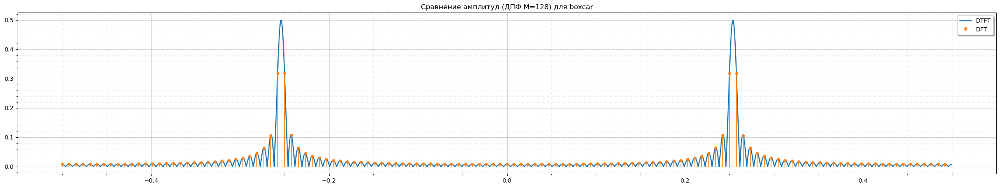

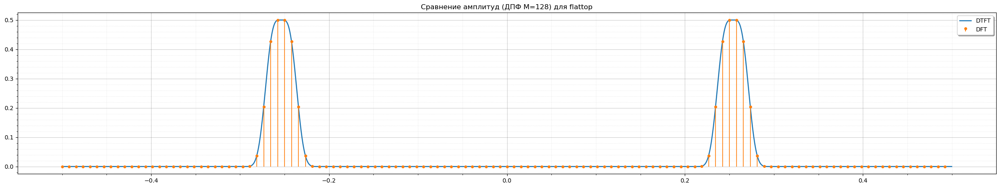

In [37]:
# Визуализация
plot_signals(
    [np.abs(spec_26_cont[0]), np.abs(spec_26[0])], [nu_26_cont, nu_26], 
    labels=["DTFT", "DFT"], 
    title="Сравнение амплитуд (ДПФ M=128) для boxcar",
    figsize=(30, 5),
    as_stem=[False, True]
)

# Визуализация
plot_signals(
    [np.abs(spec_26_cont[1]), np.abs(spec_26[1])], [nu_26_cont, nu_26], 
    labels=["DTFT", "DFT"], 
    title="Сравнение амплитуд (ДПФ M=128) для flattop",
    figsize=(30, 5),
    as_stem=[False, True]
)

# Оценка амплитуд
print(f"Теоретическая амплитуда гармоники: 0.5")
print(f"Прямоугольное окно (макс. бин): {np.max(np.abs(spec_26[0])):.4f}")
print(f"Окно с плоской вершиной (макс. бин): {np.max(np.abs(spec_26[1])):.4f}")

*Вывод:* Так как частота $n_0=32.5$ попадает ровно между бинами, возникает сильная ошибка измерения амплитуды. Прямоугольное окно дает сильную ошибку (амплитуда падает с 0.5 до ~0.318, т.е. почти на 4 дБ). Окно `flattop` за счет плоской и широкой вершины главного лепестка практически идеально сохраняет амплитуду (0.5), минимизируя эффект паразитной модуляции.

# Занятие 3. Кратковременное дискретное преобразование Фурье (STFT) 

## Задача 3.1. Спектрограмма аудиофайла.  

| Варианты: |       1      |     2     |         3        |      4     |        5        |        6       |
|:---------:|:------------:|:---------:|:----------------:|:----------:|:---------------:|:--------------:|
| **Имя файла** |'clarinet_minor.wav' | 'clarinet_major32.wav'| 'major_scale_flute1.wav' | 'major_scale_flute2.wav'|'major_scale_flute3.wav' | 'major_scale_flute4.wav'|

| Варианты: |       7      |     8     |         9        |      10     |        11        |        12       |
|:---------:|:------------:|:---------:|:----------------:|:----------:|:---------------:|:--------------:|
| **Имя файла** |'major_scale_flute5.wav'|'major_scale_piano2.wav'|'major_scale_piano3.wav'|'single_notes.wav'|'violin_natural_minor.wav'|'violin_natural_minor_up.wav'|


Вычислите кратковременное дискретное преобразование Фурье (STFT) для отсчетов сигнала, содержащихся в аудиофайле Вашего варианта. Изобразите спектрограмму сигнала. Длину окна (размер кадра), тип оконной функции, число точек в перекрытии, масштабы осей и размерность ДПФ самостоятельно подберите так, чтобы можно было выделить гармонические компоненты в сигнале. Ответьте на следующие вопросы.

1) Какие выводы можно сделать о составе данного сигнала по спектрограмме?  

2) Чему равен размер кадра в секундах и как это соотносится с графиком?

3) Какое разрешение по времени и какое по частоте у данной спектрограммы? 

4) Какие изменения можно наблюдать в спектрограмме, если изменяется:

* а) тип оконной функции,

* б) длина окна,

* в) размерность ДПФ (за счет дополнения нулевыми отсчетами)?


**Вариант 10:** Файл `'single_notes.wav'`.

Построим спектрограмму и проанализируем влияние различных параметров.

In [28]:
# Чтение аудиофайла
fs_31, audio_31 = wavfile.read('dataset_lab3_/single_notes.wav')
if audio_31.ndim > 1:
    audio_31 = audio_31[:, 0]
    
dt_31 = 1 / fs_31
    
print(f"fs: {fs_31}, audio_len: {audio_31.shape[0]}")

Audio('dataset_lab3_/single_notes.wav')

fs: 44100, audio_len: 210284


Размер окна в секундах: 0.0464 с
Разрешение по времени: 0.0232 с
Разрешение по частоте (сетка): 21.5332 Гц


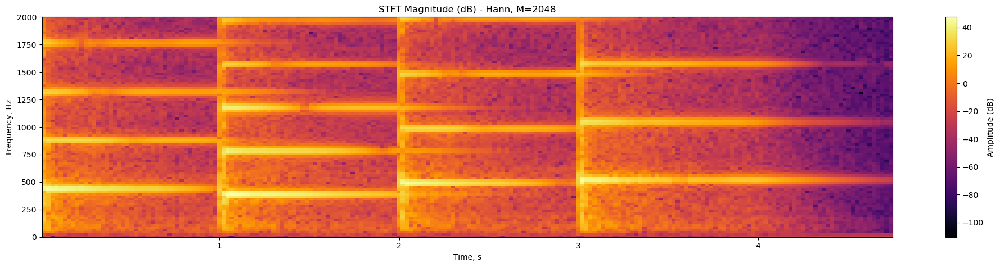

In [29]:
# Базовая спектрограмма для анализа состава
nperseg_base = 2048
noverlap_base = nperseg_base // 2
nfft = nperseg_base

print(f"Размер окна в секундах: {nperseg_base * dt_31:.4f} с")
print(f"Разрешение по времени: {(nperseg_base - noverlap_base) * dt_31:.4f} с")
print(f"Разрешение по частоте (сетка): {fs_31 / nfft:.4f} Гц")

_ = compute_stft(
    audio_31, 
    Fs=fs_31, 
    nperseg=nperseg_base, 
    noverlap=noverlap_base, 
    nfft=nfft,
    window='hann',
    plot_results=True, 
    use_log_scale=True, 
    cmap='inferno',
    limits=(None, (0, 2000)),
    labels=f"Hann, M={nperseg_base}",
    figsize=(20, 5)
)

Исследуем влияние оконных функций, длины окна и размера ДПФ на вид спектрограммы:

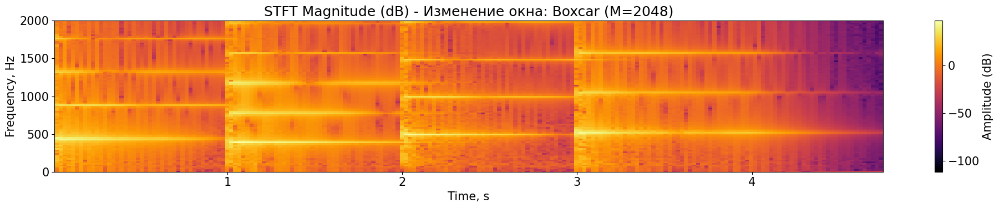

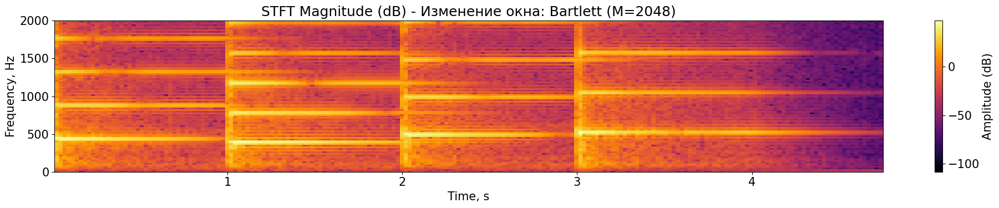

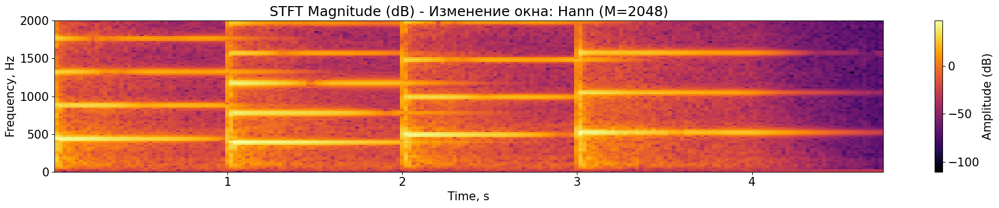

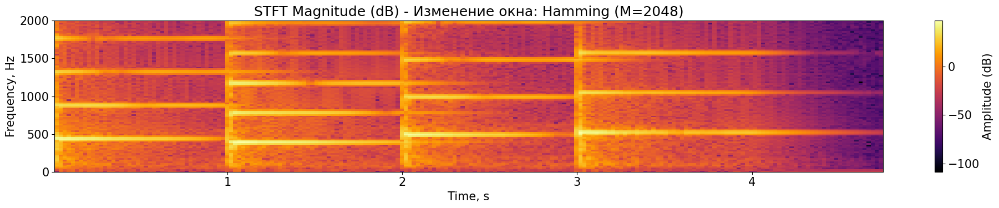

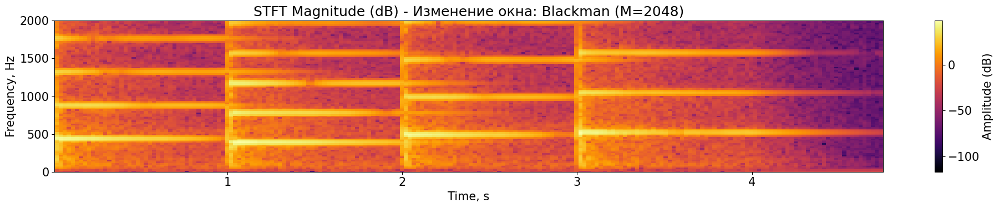

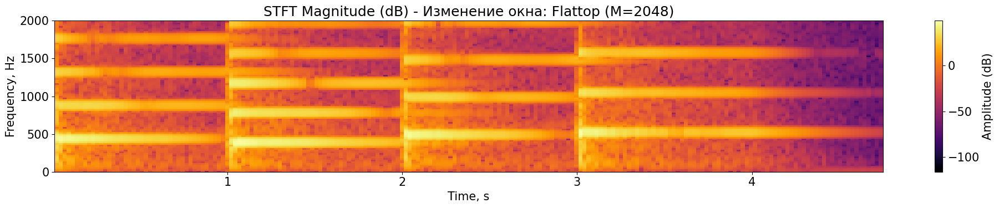

In [30]:
# 1. Изменение оконной функции
for win in \
[
    'boxcar',
    'bartlett', 
    'hann', 
    'hamming', 
    'blackman', 
    'flattop',
    
]:
    compute_stft(
        audio_31, Fs=fs_31, nperseg=nperseg_base, noverlap=noverlap_base, nfft=nfft, window=win,
        plot_results=True, use_log_scale=True, cmap='inferno', limits=(None, (0, 2000)),
        labels=f"Изменение окна: {win.capitalize()} (M=2048)", figsize=(20, 4)
    )

In [ ]:
# 2. Изменение длины окна (M)
for m_val in [512, 1024, 2048, 4096, 8192, 16300, 32000]:
    compute_stft(
        audio_31, Fs=fs_31, nperseg=m_val, noverlap=m_val//2, window='hann',
        plot_results=True, use_log_scale=True, cmap='inferno', limits=(None, (0, 2000)),
        labels=f"Изменение размера окна: M={m_val}", figsize=(20, 4)
    )

TypeError: unsupported operand type(s) for //: 'NoneType' and 'int'

In [45]:
nperseg_base = 512

In [46]:
fs_31

44100

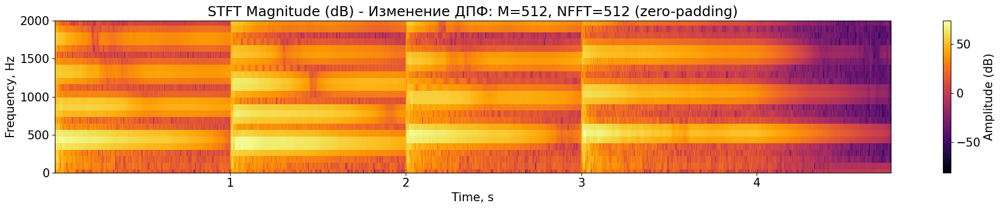

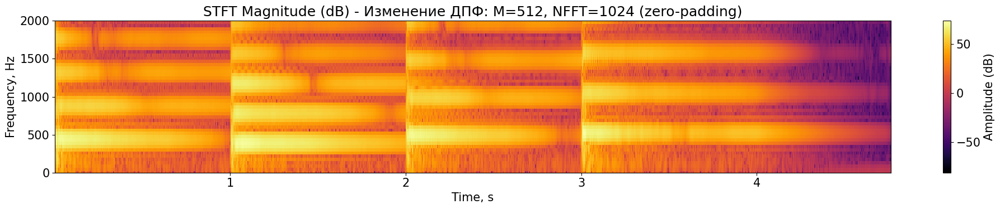

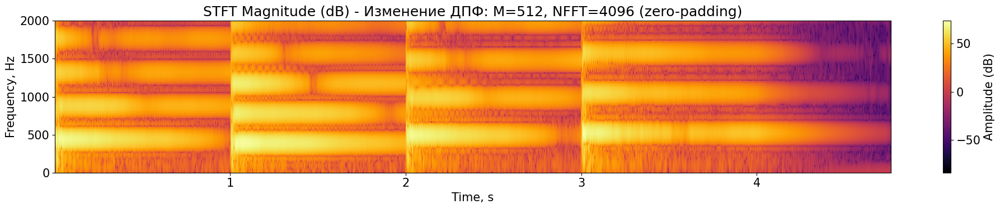

: 

In [ ]:
# 3. Изменение размерности ДПФ (Zero-padding)
for nfft in [512, 1024, 4096]:
    compute_stft(
        audio_31, Fs=fs_31, nperseg=nperseg_base, noverlap=nperseg_base // 2, nfft=nfft, window='hann',
        plot_results=True, use_log_scale=True, cmap='inferno', limits=(None, (0, 2000)),
        labels=f"Изменение ДПФ: M={nperseg_base}, NFFT={nfft} (zero-padding)", figsize=(20, 4)
    )

**Ответы на вопросы:**
1) По спектрограмме видно, что сигнал состоит из последовательно играющихся одиночных гармонических нот (отчетливо видны основные частоты и их высшие гармоники).
2) Базовый размер кадра (при $M=2048$) равен $\approx 0.046$ с. На графике это определяет "толщину" вертикальных переходных процессов (чем больше кадр, тем сильнее размазываются границы между нотами по времени).
3) Разрешение по времени составляет $\approx 0.023$ с (шаг сдвига окна). Разрешение по частоте (шаг сетки ДПФ) $\approx 21.5$ Гц. Реальное частотное разрешение хуже из-за ширины лепестка окна.
4) **Изменения спектрограммы:**
   * **а) Окно:** `boxcar` дает сильное "протекание" частот (вертикальные полосы-артефакты от боковых лепестков). `blackman` очищает фон, но слегка утолщает линии частот.
   * **б) Длина кадра:** Короткое окно (512) размывает гармоники по вертикали (плохое частотное разрешение), но делает четкими границы начала нот по горизонтали (хорошее временное). Длинное (8192) - наоборот: идеальные тонкие линии частот, но ноты "наплывают" друг на друга.
   * **в) Размер ДПФ (NFFT):** Улучшает визуальную гладкость по оси частот за счет интерполяции спектра, но физическое разрешение окна (ширину лепестков) не улучшает.

## Задача 3.2. Спектрограмма ЛЧМ сигнала. 

| Варианты: | 1 | 2 | 3 | 4 | 5 | 6 | 7 | 8 | 9 | 10 | 11 | 12 |
|:--:|:--:|:--:|:--:|:--:|:--:|:--:|:--:|:--:|:--:|:--:|:--:|:--:|
|$f_0$, Гц | 170| 80 | 90 | 75 | 120 | 130 | 85 | 95 | 70 | 65 | 110 | 105 |
|$f_1$, Гц | 800 | 900 | 850 | 870 | 820 | 875 | 780 | 810 | 790 | 825 | 830 | 840 |

Постройте спектрограмму c окном Блэкмана для ЛЧМ-сигнала длительностью $T=2$ секундам, мгновенная частота которого изменяется от $f_0$ до $f_1$, частота дискретизации $f_s=2000$ Гц. Начальный размер кадра (`nperseg`) выберите $H=512$ отсчетов. Пронаблюдайте, как изменяется спектрограмма при изменении следующих параметров:
* тип оконной функции (`window`),
* длина кадра (`nperseg`),
* размерность ДПФ (`nfft`).

**Вариант 10:** $f_0 = 65$ Гц, $f_1 = 825$ Гц.

$T=2$ с, $f_s=2000$ Гц. Базовое окно: Блэкман, $M=512$.

In [ ]:
fs_32 = 2000 
dt_32 = 1 / fs_32

f0 = 65
f1 = 825

nperseg = 512
noverlap = 0
nfft = nperseg

t_32 = np.arange(0, 2, 1/fs_32)
x_32 = sg.chirp(t_32, f0=f0, f1=f1, t1=2, method='linear')

print(f"Размер окна в секундах: {nperseg * dt_32:.4f} с")
print(f"Разрешение по времени: {(nperseg - noverlap) * dt_32:.4f} с")
print(f"Разрешение по частоте (сетка): {fs_32 / nfft:.4f} Гц")

Размер окна в секундах: 0.2560 с
Разрешение по времени: 0.2560 с
Разрешение по частоте (сетка): 3.9062 Гц


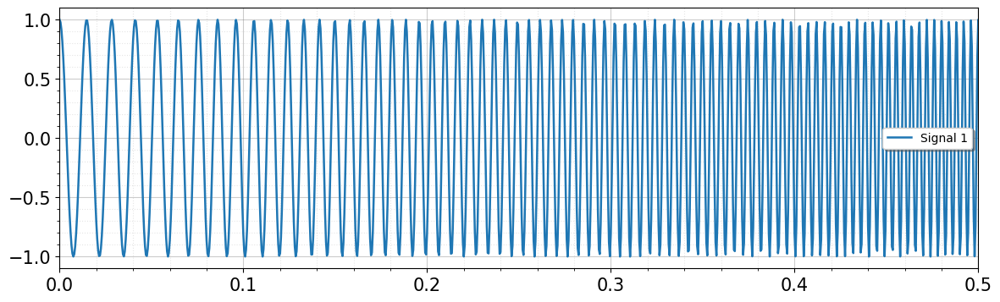

In [ ]:
plot_signals(x_32, t_32, figsize=(14, 4), limits=((0, 0.5), None))

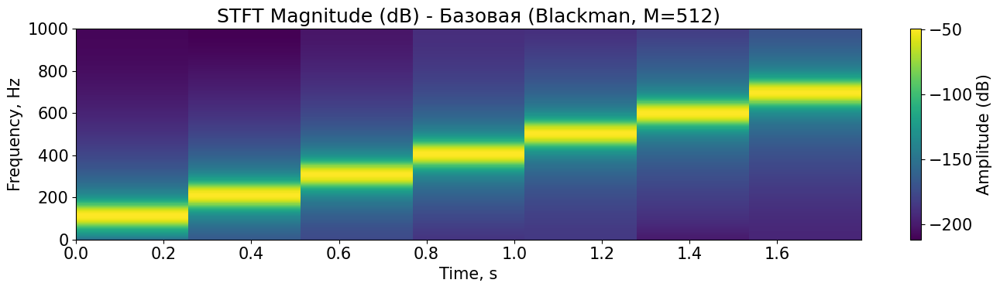

In [ ]:
# Базовая спектрограмма
_ = compute_stft(
    x_32, Fs=fs_32, nperseg=nperseg, noverlap=noverlap, window='blackman',
    plot_results=True, use_log_scale=True, cmap='viridis', limits=(None, (0, 1000)),
    labels=f"Базовая (Blackman, M={nperseg})", figsize=(14, 4)
)

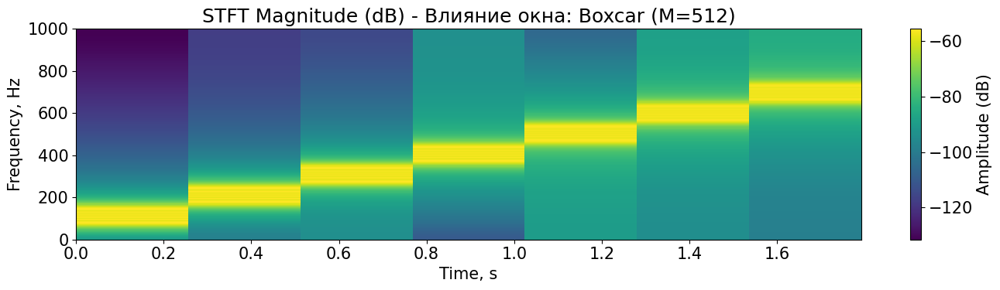

In [ ]:
# Влияние типа окна
_ = compute_stft(
    x_32, Fs=fs_32, nperseg=nperseg, noverlap=noverlap, window='boxcar',
    plot_results=True, use_log_scale=True, cmap='viridis', limits=(None, (0, 1000)),
    labels=f"Влияние окна: Boxcar (M={nperseg})", figsize=(14, 4)
)

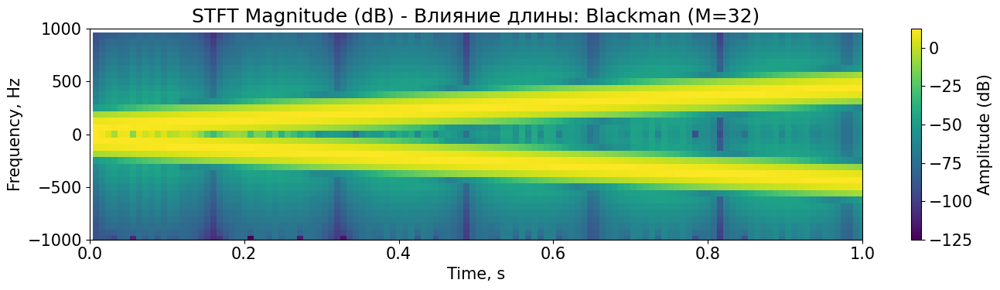

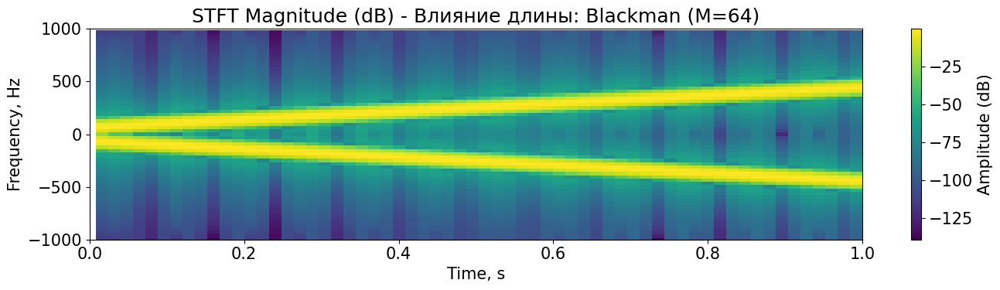

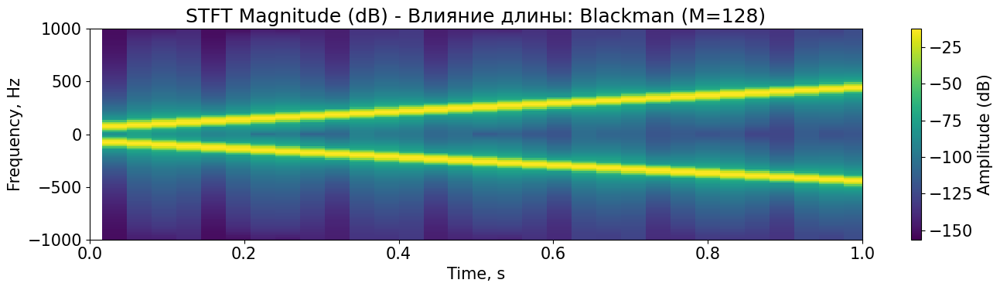

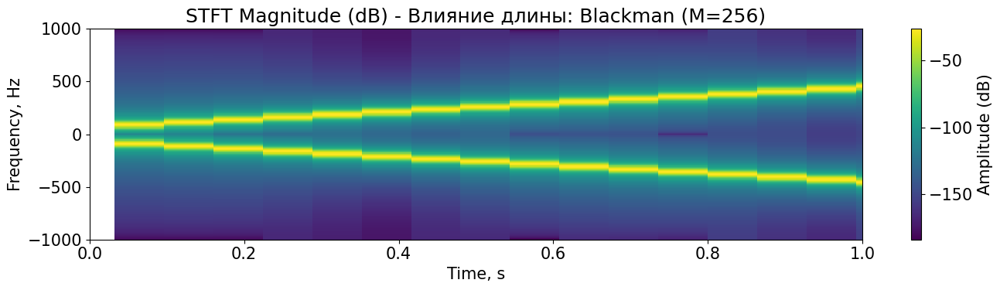

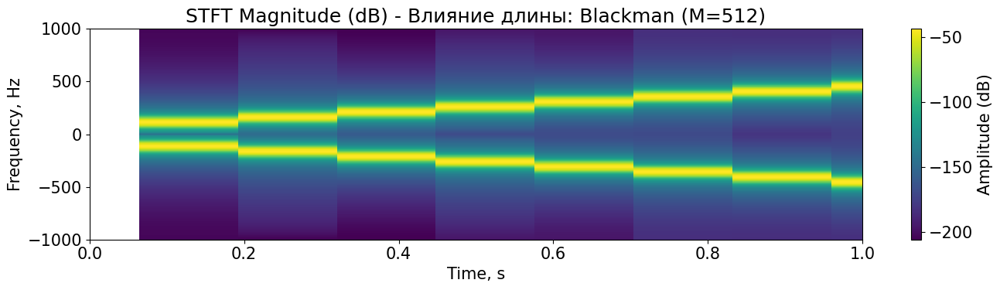

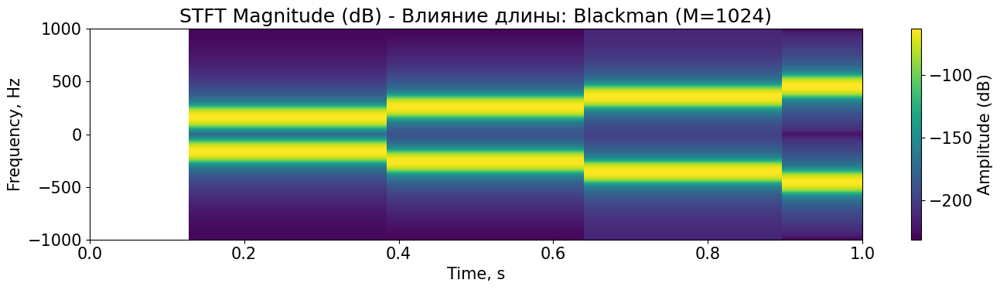

In [ ]:
# Влияние длины кадра
for m_val in [32, 64, 128, 256, 512, 1024]:
    _ = compute_stft(
        x_32, Fs=fs_32, nperseg=m_val, noverlap=m_val // 2, window='blackman',
        plot_results=True, use_log_scale=True, cmap='viridis', limits=((0, 1), None),
        labels=f"Влияние длины: Blackman (M={m_val})", figsize=(14, 4)
    )

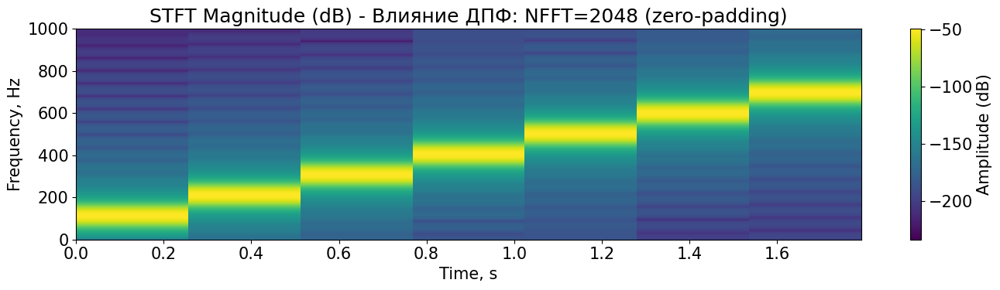

In [ ]:
# Влияние размерности ДПФ
_ = compute_stft(
    x_32, Fs=fs_32, nperseg=nperseg, noverlap=noverlap, nfft=100000, window='blackman',
    plot_results=True, use_log_scale=True, cmap='viridis', limits=(None, (0, 1000)),
    labels="Влияние ДПФ: NFFT=2048 (zero-padding)", figsize=(14, 4)
)

*Выводы по ЛЧМ-сигналу:*
1) **Окно:** Прямоугольное окно (Boxcar) порождает сильные артефакты (вертикальные тени) по всему диапазону частот из-за высоких боковых лепестков.
2) **Длина кадра (M):** При малом `nperseg` (128) "трек" сигнала становится очень широким по частоте (разрешение падает). При большом (1024) - линия становится тоньше, но ступеньки времени (особенно на быстро меняющейся частоте) визуально более выражены. Мы наблюдаем классический принцип неопределенности: нельзя одновременно получить идеальное разрешение и по частоте, и по времени.
3) **NFFT:** Увеличение NFFT с 512 до 2048 делает отображаемую наклонную линию более четкой, но физическую толщину "трека" не сужает.

# Примеры вычислений на Python для лабораторной работы №3

## Обработка wav-файла 

Чтение звукового wav-файла можно провести с помощью функции `scipy.io.wavfile.read`. На вход она принимает первым параметром (и единственным обязательным) адрес файла, который требуется декодировать. Функция возвращает частоту дискретизации в Гц (`fs`) и (`x`) - массив отсчетов. В случае монозаписи (одноканальной) массив `x` одномерный, а у случае стереозаписи (двуканальной) —  двумерный, где номера строк соответствуют разным каналам записи, а номера столбцов – индексам отсчетов. 

Цифровой сигнал является одновременно и дискретизованным по времени, и квантованным по уровню. Поэтому каждый отсчет кодируется заданным числом бит, определяемым типом данных для элементов массива `x`. Например, для `int16` один отсчет занимает 16 бит (16 двоичных разрядов), а число уровней квантования $2^{16}$. 

In [ ]:
import scipy.io.wavfile
import numpy as np
fs, x = scipy.io.wavfile.read('dataset_lab3_/cello4.wav')
print("Частота дискретизации %.0f Гц" %fs)
print("Тип данных", x.dtype)
print("Размер массива", x.shape)
print("Число отсчетов записи", x.shape[0])

Частота дискретизации 44100 Гц
Тип данных int16
Размер массива (420237,)
Число отсчетов записи 420237


Воспроизведем звукозапись. 

In [ ]:
from IPython.display import Audio
Audio('./dataset_lab3_/cello4.wav')

Если запись двуканальная, возьмем в рассмотрение только один канал.

In [ ]:
if len(x.shape)==2:
    x=x[:, 0]

Построим график сигнала во временной области. Для выделения фрагмента можно использовать функцию `plt.xlim` или инструменты zoom и pan (при backend notebook). Для использования zoom нужно выделить прямоугольником область графика, которую требуется рассмотреть. Для использования pan при нажатой левой кнопке мыши график можно перемещать, а нажатой правой кнопке мыши — изменять масштаб по осям. 
* `np.arange(x.size)/fs` — массив отсчетов во времени $k\Delta t = k/f_д$, $k=0,\;1,\; \dots, N-1$, $N$ — число отсчетов сигнала.

<>:8: SyntaxWarning: invalid escape sequence '\D'
<>:8: SyntaxWarning: invalid escape sequence '\D'
C:\Users\Skifv\AppData\Local\Temp\ipykernel_12184\1914327388.py:8: SyntaxWarning: invalid escape sequence '\D'
  plt.ylabel("$x(k\Delta t)$") # подпись оси ординат


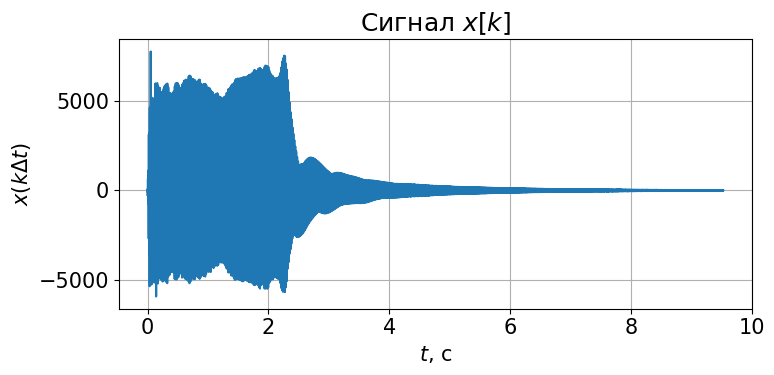

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=[8, 4]) # размер полотна
plt.plot(np.arange(x.size)/fs, x) # график сигнала (точками)
plt.grid() # сетка 
# plt.xlim([1, 1.07]) # Выделение фраграмента от 1 с до 1,07 с
plt.title("Cигнал $x[k]$") # заголовок графика
plt.xlabel("$t$, c") # подпись оси абсцисс
plt.ylabel("$x(k\Delta t)$") # подпись оси ординат
plt.tight_layout()
plt.show()

Оценим спектр исходного сигнала с помощью ДВПФ для выборок сигнала $\Delta t x(k\Delta t)$ (`x/fs`). Связь между спектрами аналогового сигнала и цифрового в данном случае:
$$X_д (f) =  \sum_{m=-\infty}^{\infty} X_а(f+m f_д )$$

* Если пренебречь эффектом наложения спектров, то на интервале $[-f_д/2; \; f_д/2]$ выполняется $X_а (f) \approx X_д(f) $. 

* Тогда можно построить оценку спектра $$\hat{X}_а (f) = X_д(f)\;\; при \;\; f\in[-f_д/2; \; f_д/2].$$ Вычислим ее в `Nfft` точках, равномерно расположенных на полуинтервале  $[-f_д/2; \; f_д/2)$.

* Поскольку правый конец полуинтервала (точка $f_д/2$) не включается, при задании частот нужно указать `endpoint=False`. 

* ДВПФ в этих точках вычислим с помощью ДПФ (`scipy.fft.fft` или `np.fft.fft`). 

* Чтобы перенести отсчеты ДПФ c полуинтервала $[0, f_д)$ на полуинтервал $[-f_д/2; \; f_д/2)$  используем функцию `scipy.fft.fftshift` или `np.fft.fftshift`.

* Определим размерность ДПФ `Nfft` как наибольшее из двух: $2^{19}$ и результата работы функции `scipy.fft.next_fast_len` для длины последовательности. Функция `scipy.fft.next_fast_len` определить следующую размерность ДПФ, для которой вычисления по алгоритму быстрого преобразования Фурье проходят эффективно. 

In [ ]:
2**19

524288

In [ ]:
import scipy.fft
Nfft=max(scipy.fft.next_fast_len(x.size), 2**19) 
f, Xf = scipy.fft.fftshift(scipy.fft.fftfreq(Nfft))*fs, scipy.fft.fftshift(scipy.fft.fft(x/fs, Nfft))

In [ ]:
f

array([-22050.        , -22049.91588593, -22049.83177185, ...,
        22049.74765778,  22049.83177185,  22049.91588593], shape=(524288,))

In [ ]:
print("Размерность ДПФ", Nfft) 

Размерность ДПФ 524288


<>:7: SyntaxWarning: invalid escape sequence '\h'
<>:7: SyntaxWarning: invalid escape sequence '\h'
C:\Users\Skifv\AppData\Local\Temp\ipykernel_12184\2627917993.py:7: SyntaxWarning: invalid escape sequence '\h'
  plt.ylabel("$|\hat{X}_a(f)|$")


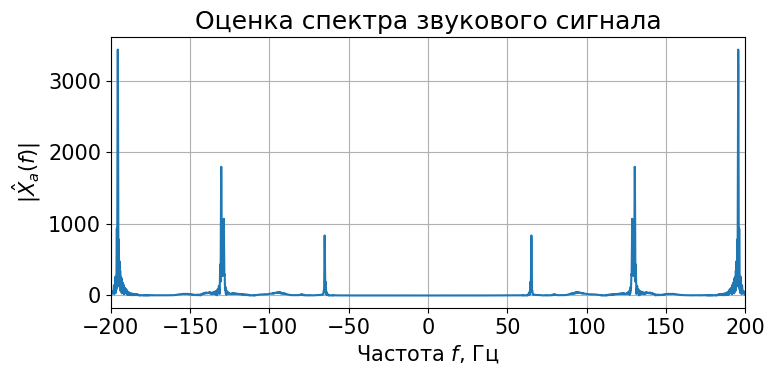

In [ ]:
plt.figure(figsize=[8, 4])
plt.title("Оценка спектра звукового сигнала")
plt.plot(f, abs(Xf), '-')
plt.xlim((-200, 200))
plt.grid()
plt.xlabel("Частота $f$, Гц")
plt.ylabel("$|\hat{X}_a(f)|$")
plt.tight_layout()
plt.show()

Пример анализа графика: во временной области мы можем наблюдать повторение через  

In [ ]:
print("%.3f c" % (1.00214-0.98680))

0.015 c


Такому периоду соотвествует частота 

In [ ]:
print("%.3f Гц" % (1/(1.00214-0.98680)))

65.189 Гц


Примерно на этой частоте мы наблюдаем первую гармонику в спектре сигнала. 

## Распознование сигнала с помощью ДПФ

Определим ДПФ сигнала из $N=64$ точек 
$$x[k] = \sin \left(2\pi  \dfrac{12}{N} k\right) + 2 \sin \left(2\pi  \dfrac{18}{N} k +\dfrac{\pi}{3}\right)$$

In [ ]:
N=64
k=np.arange(N)
x=np.sin(2*np.pi*k*12/N)+2*np.sin(2*np.pi*k*18/N+np.pi/3)

В теоретической части работы рассматривался пример задачи спектрального анализа по обнаружению и оцениванию параметров сигнала. Пусть обрабатываемая последовательность имеет вид
$$x[k]=\sum\limits_{m=1}^{M}{{{A}_{m}}}\sin (2\pi \frac{m}{N}k+{{\varphi }_{m}}),\quad k=0,\ 1,\ 2,\ \ldots ,\ N-1,$$
где ${{A}_{m}}$ и ${{\varphi }_{m}}$ – неизвестные заранее амплитуды и фазы гармонических составляющих; $m$– неизвестные заранее целые числа, определяющие нормированные частоты ${{\nu }_{m}}=m/N$ гармонических составляющих, которые совпадают с бинами ДПФ. Для определения ${{A}_{m}}$ и ${{\varphi }_{m}}$ в этом случае достаточно вычислить ДПФ последовательности: 
	$$\tilde{X}[n]=\frac{1}{N}\sum\limits_{k=0}^{N-1}{x[k]}{{e}^{-j\frac{2\pi }{N}nk}}.$$
Неизвестные амплитуды и фазы определяются как
${{A}_{m}}=2\left| \tilde{X}[m] \right|;\quad {{\varphi }_{m}}=\arg \tilde{X}[m]+\pi /2,\ \ m\in \left[ 0,\ \frac{N}{2}-1 \right]$


Для расчетов удобно сразу взять формулу ДПФ с нормировкой на число отсчетов:

In [ ]:
Xn=np.fft.fft(x)/N

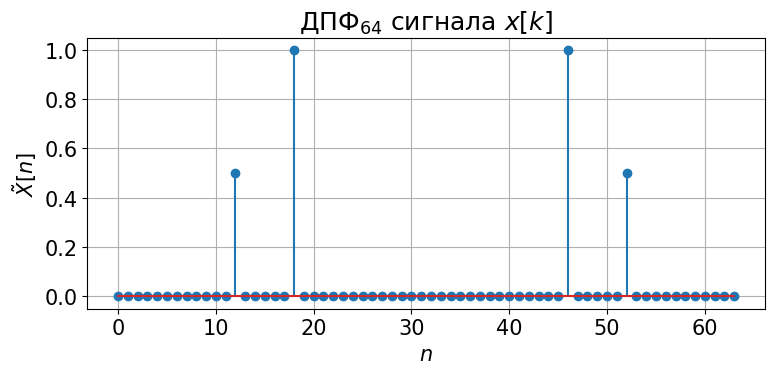

In [ ]:
plt.figure(figsize=[8, 4])
plt.title("ДПФ$_{%i}$ сигнала $x[k]$" %N)
plt.stem(np.arange(Xn.size), abs(Xn))
plt.ylabel("$\\tilde{X}[n]$")
plt.xlabel("$n$")
plt.tight_layout()
plt.grid()
plt.show()

На левой половине периода ненулевыми являются отсчеты ДПФ $n=12$ и $n=18$.

$$x[k]=A_{12} \sin \left(2\pi \dfrac{12}{64}k+{{\varphi }_{12}} \right) + A_{18} \sin \left(2\pi \dfrac{18}{64}k+{{\varphi }_{18}} \right),\quad k=0,\ 1,\ 2,\ \ldots ,\ 63.$$

Остается опредлить неизвестные амплитуды и фазы $A_{12}$, $A_{18}$, ${\varphi }_{12}$, ${\varphi }_{18}$. 

$A_{12}$

In [ ]:
2*abs(Xn[12])

np.float64(1.0000000000000007)

$A_{18}$

In [ ]:
2*abs(Xn[18])

np.float64(1.999999999999999)

${\varphi }_{12}$

In [ ]:
phi_12 = np.angle(Xn[12])+(np.pi/2)
phi_12

np.float64(-1.5543122344752192e-15)

${\varphi }_{18}$

In [ ]:
phi_18 = np.angle(Xn[18])+(np.pi/2)
phi_18

np.float64(1.0471975511965972)

${\varphi }_{18}$ сооставляет $1/3$ от $\pi$.

In [ ]:
phi_18/np.pi

np.float64(0.33333333333333315)

Оценка сигнала

$$x[k] = \sin \left(2\pi  \dfrac{12}{N} k\right) + 2 \sin \left(2\pi  \dfrac{18}{N} k +\dfrac{\pi}{3}\right)$$

## Оконные функции

`scipy.signal.get_window(window, Nx, fftbins=True)` Возвращает отсчеты оконной функции заданного типа и длины. 

**Parameters:**

`window` *string, float, or tuple* Тип оконной функции. 
* ***string***  Если окно непараметрическое (например, `boxcar`, `blackman`, `hamming`, `hann`, `bartlett`, `flattop`), то `window` — название окна (строка).

Название окна | Прямоугольное| Блэкмана|Хемминга| Ханна| Бартлета | С плоской вершиной
:----:  | :----:  | :----:    | :----:  | :----:| :----:    |  :----:   
***string*** | `boxcar`| `blackman`|`hamming`| `hann`| `bartlett`| `flattop`


* ***tuple*** Если окно параметрическое, то окно задается кортежем, где нулевой элемент — название окна (строка), а последующие элементы - параметры окна. Например, `('chebwin', 13)` — окно Чебышёва с уровнем боковых лепестков 13 дБ относительно главного, `('kaiser', 5)` — окно Кайзера с параметром $\beta=5$. 

Название окна | Кайзера| Чебышёва |
:----:  | :----:  | :----:    |
 ***tuple*** | `(kaiser, beta)` | `(chebwin, attenuation)`|
* ***float***  Для случая окна Кайзера можно сразу указать значение $\beta$ в параметр `window`.  Запись `window = 5` эквивалентна `window = ('kaiser', 5)`






`Nx` *int* Длина окна. 

`fftbins` *bool, optional* Если параметр равен `True` (по умолчанию), то создается окно для ДПФ, если `False` — симметричное на интервале $[0, N_x-1]$ окно, используемое для синтеза КИХ-фильтров.


**Returns:**

`get_window` *ndarray* Одномерный массив отсчетов окна длины `Nx`.

In [ ]:
plt.figure(figsize=[8, 3], dpi=100)
Nfft=2**18

N = 16
w = signal.get_window('boxcar', N)
# w = signal.get_window(('kaiser', 5), N)
# w = signal.get_window(5, N)
# w = signal.get_window(('chebwin', 13), N, fftbins=False)
k = np.arange(N)
nu, W = np.linspace(-0.5, 0.5, num=Nfft, endpoint=False), scipy.fft.fftshift(scipy.fft.fft(w, Nfft))

plt.subplot(1, 3, 1)
plt.stem(k, w)
plt.xlabel('$k$')
plt.ylabel('$w[k]$')


plt.subplot(1, 3, 2)
k=np.arange(N)
plt.plot(nu, abs(W))
plt.xlabel('$\\nu$')
plt.ylabel('$|W(\\nu)|$')
plt.grid()


plt.subplot(1, 3, 3)
k=np.arange(N)
with np.errstate(divide='ignore'): # Отключаем RuntimeWarning
    plt.plot(nu, 20*np.log10(abs(W)/max(abs(W))))
plt.ylim(ymin=-60)
plt.grid()
plt.xlabel('$\\nu$')
plt.ylabel(r'$20 \lg |\frac{W(\nu)}{W(0)}|$, дБ')
plt.tight_layout()
# plt.ylim((-30, 5))

NameError: name 'signal' is not defined

<Figure size 800x300 with 0 Axes>

## Взвешивание сигнала оконной функцией

### Пример 1. Различимость спектральных компонент.

Рассмотрим 64-точечный сигнал ($k=0,\;1,\;\dots, 63$)
$$x[k]=\sin\left( 2 \pi k \dfrac{11}{64}\right)+\sin\left( 2 \pi k \dfrac{13}{64}\right).$$
* Пример ниже показывает, что в случае прямоугольного окна (`w = signal.get_window('boxcar', N)`) спектральные компоненты вблизи частот $\nu_1={11}/{64}$ и  $\nu_2={13}/{64}$ различимы в ДВПФ. 
* Если выбрать окно Блэкмана(`w = signal.get_window('blackman', N)`) или окно Кайзера с параметром $\beta=8$ (`w = signal.get_window(('kaiser', 8), N)`), то эти спектральные компоненты неразличимы в ДВПФ.
* Если спектральные компоненты неразличимы в ДВПФ, то невозможно подобрать такую размерность ДПФ (`N_dft`), чтобы они оказались различимы в ДПФ. В противном случае это возможно. 

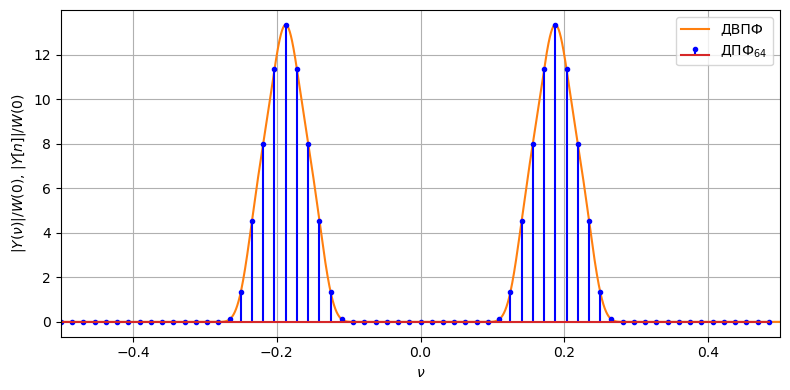

In [ ]:
N=64
N_dtft=2**14
N_dft=64
k=np.arange(N)
x=np.sin(2*np.pi*k*11/N)+np.sin(2*np.pi*k*13/N)

# w = signal.get_window('boxcar', N)
# w = signal.get_window('blackman', N)
# w = signal.get_window(('kaiser', 8), N)
w = signal.get_window('flattop', N)
y = x * w # Взвешивание сигнала оконной функцией
W0 = sum(w)

nu_dtft, X_dtft = np.linspace(-0.5, 0.5, num=N_dtft, endpoint=False), scipy.fft.fftshift(scipy.fft.fft(y, N_dtft))
nu_dft, X_dft = np.linspace(-0.5, 0.5, num=N_dft, endpoint=False), scipy.fft.fftshift(scipy.fft.fft(y, N_dft))


plt.figure(figsize=[8, 4], dpi=100)
plt.plot(nu_dtft, abs(X_dtft), 'C1', label='ДВПФ')
plt.stem(nu_dft, abs(X_dft), linefmt='b', markerfmt='.b', label='ДПФ$_{%i}$' % N_dft)
plt.xlabel('$\\nu$')
plt.ylabel('$|Y(\\nu)|/W(0)$, $|Y[n]|/W(0)$')
plt.xlim([-0.5, 0.5])
plt.legend()
plt.grid()
plt.tight_layout()

### Пример 2. Амплитудная модуляция спектра.
Рассмотрим 32-точечный сигнал ($k=0,\;1,\;\dots, 31$)
$$x[k]=\cos\left( 2 \pi k \dfrac{9.5}{32}\right)=\frac{1}{2}\exp\left({j2 \pi k \dfrac{9.5}{32}}\right)+\frac{1}{2}\exp\left({-j2 \pi k \dfrac{9.5}{32}}\right)$$
* Пусть $y[k]=x[k]w[k]$, где $w[k]$ — некоторое окно. ДВПФ сигнала $y[k]$ 
$$Y(\nu)=\dfrac{1}{2} W\left(\nu- \dfrac{9.5}{32} \right)+\dfrac{1}{2} W\left(\nu+ \dfrac{9.5}{32} \right).$$
Чтобы высоты максимумов на графике ДВПФ соответствовали амплитудам гармоник, нужно нормировать ось ординат на $W(0)$.
* Если выбрать прямоугольное окно, `w = signal.get_window('boxcar', N)`, то оценки амплитуд, получаемые с помощью ДПФ$_{32}$, ,будут отличаться от истинных значений на $-3,92$ дБ (значение коэффициента паразитной амплитудной модуляции). 
* Результат можно исправить, дополняя сигнал нулевыми отсчетами и увеличивая размерность ДПФ. 
* Без изменения размерности ДПФ лучшего результата можно добиться с помощью окна с плоской вершиной `w = signal.get_window('flattop', N)`.
* В реальности часто частоты гармоник неизвестны. Поэтому для оценки амплитуд используются окна с низким коэффициентом паразитной амплитудной модуляции (например, flattop-окно).

<>:24: SyntaxWarning: invalid escape sequence '\d'
<>:24: SyntaxWarning: invalid escape sequence '\d'
C:\Users\Skifv\AppData\Local\Temp\ipykernel_22688\3215485891.py:24: SyntaxWarning: invalid escape sequence '\d'
  plt.ylabel('$\dfrac{|Y(\\nu)|}{W(0)}$, $\dfrac{|Y[n]|}{W(0)}$')


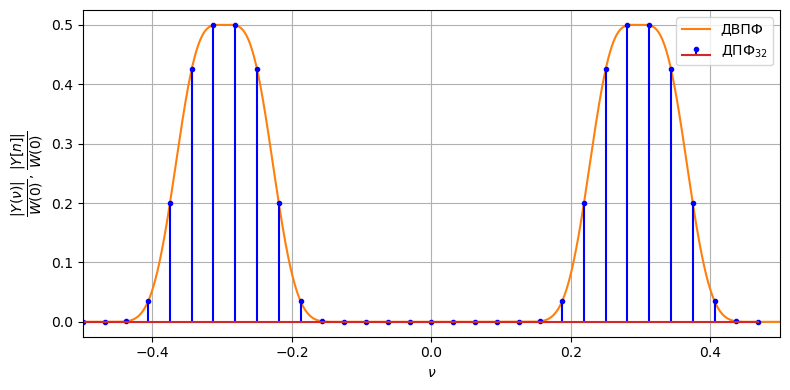

In [ ]:
N=64
N_dtft=2**14
N=32
N_dft=32
k=np.arange(N)
x=np.cos(2*np.pi*9.5/N*k)

# w = signal.get_window('boxcar', N)
# w = signal.get_window('blackman', N)
# w = signal.get_window(('kaiser', 8), N)
w = signal.get_window('flattop', N)
y = x * w
W0 = sum(w)


nu_dtft, X_dtft = np.linspace(-0.5, 0.5, num=N_dtft, endpoint=False), scipy.fft.fftshift(scipy.fft.fft(y, N_dtft))
nu_dft, X_dft = np.linspace(-0.5, 0.5, num=N_dft, endpoint=False), scipy.fft.fftshift(scipy.fft.fft(y, N_dft))


plt.figure(figsize=[8, 4], dpi=100)
plt.plot(nu_dtft, abs(X_dtft)/W0, 'C1', label='ДВПФ')
plt.stem(nu_dft, abs(X_dft)/W0, linefmt='b', markerfmt='.b', label='ДПФ$_{%i}$' % N_dft)
plt.xlabel('$\\nu$')
plt.ylabel('$\dfrac{|Y(\\nu)|}{W(0)}$, $\dfrac{|Y[n]|}{W(0)}$')
plt.xlim([-0.5, 0.5])
plt.legend()
plt.grid()
plt.tight_layout()

## Кратковременное дискретное преобразование Фурье (STFT)

Кратковременное дискретное преобразование Фурье (Discrete  STFT, англ. Discrete Short-time Fourier transform) можно задать формулой
$${{X}_{m}}[n]=\sum\limits_{k=mR}^{mR+M-1}{x}[k]w[k-mR]\exp \left( -j2\pi \frac{nk}{{{N}_{\text{FFT}}}} \right),$$
где 
* $w[k]$ — временное окно, 
* $m$ — порядковый номер сегмента, 
* $M$ — длина окна (сегмента), 
* ${{N}_{\text{FFT}}}$ – размерность ДПФ, 
* $R=M-L$ – единичный сдвиг окна, 
* $L$ — размер перекрытия. 

Это преобразование позволяет осуществлять ДПФ-анализ на коротких интервалах времени. Для графического отображения результатов данного преобразования часто используется представление в виде графика с двумя осями, где по горизонтальной оси отображается время (или номер кадра $m$), по вертикальной — соответствующие частоты, а цветом отображается $|{{X}_{m}}[n]|$, $|{{X}_{m}}[n]{{|}^{2}}$ (в случае спектрограммы), или фазовая часть ${{X}_{m}}[n]$.


### Функция scipy.signal.stft

`scipy.signal.stft(x, fs=1.0, window='hann', nperseg=256, noverlap=None, nfft=None, detrend=False, return_onesided=True, boundary='zeros', padded=True, axis=-1, scaling='spectrum')` Расчет кратковременного дискретного преобразования Фурье (STFT)

**Основные параметры:**

`x` *array_like* Отсчеты сигнала. 

`fs` *float, optional* Частота дискретизации. 

`window` *str or tuple or array_like, optional* Используемое окно. Задается в виде параметров для функции `get_window` (без указания длины) или в виде массива отсчетов окна. По умолчанию генерируется окно Ханна. 

`nperseg` *int, optional* Длина сегмента $M$ (длина окна). По умолчанию 256.

`noverlap` *int, optional* Число точек в перекрытии $L$. По умолчанию, используется 50% перекрытие. 

`nfft` *int, optional* Размерность ДПФ сегментов.

Описание параметров `detrend`, `return_onesided`, `boundary`, `padded` , `axis`, `scaling: {‘spectrum’, ‘psd’}` можно найти в API reference SciPy. 

**Returns:**
`f` *ndarray* Массив частот спектрограммы.

`t` *ndarray* Массив времен спектрограммы.

`Zxx` *ndarray* Значения STFT.

### Пример построения спектрограммы

In [ ]:
import numpy as np # импорт бибилиотеки numpy
import matplotlib.pyplot as plt # импорт модуля matplotlib.pyplot
from scipy import signal
import scipy.io.wavfile
from IPython.display import Audio

fs, x = scipy.io.wavfile.read('dataset_lab3_/vibraphone-loop-1.wav')
if x.shape[1]>1:
    x=x[:, 0] # берем левый канал в случае, если wav-файл — стереозапись 
Audio('./dataset_lab3_/vibraphone-loop-1.wav')

C:\Users\Skifv\AppData\Local\Temp\ipykernel_22688\195427250.py:7: WavFileWarning: Chunk (non-data) not understood, skipping it.
  fs, x = scipy.io.wavfile.read('dataset_lab3_/vibraphone-loop-1.wav')


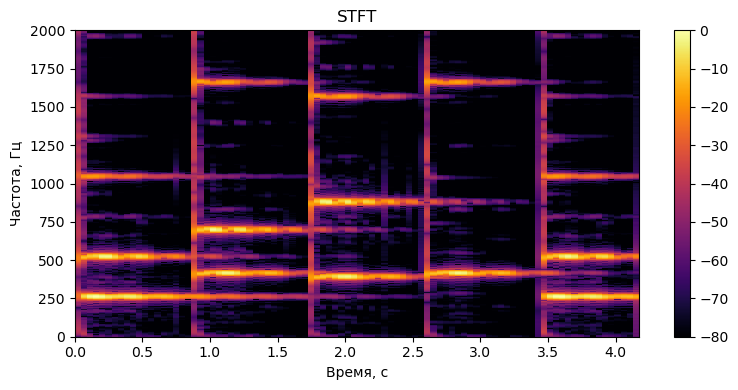

In [ ]:
plt.figure(figsize=[8, 4], dpi=100)
f, t, Zxx = signal.stft(x, fs=fs, window=('hann'), nperseg=4000, noverlap=2000, nfft=2**15)
plt.pcolormesh(t, f,  20*np.log10(np.abs(Zxx[:-1, :-1])/np.max(abs(Zxx))), vmin=-80, cmap=plt.get_cmap('inferno'), shading='flat')
plt.colorbar()
plt.ylim((0, 2000))
plt.title('STFT')
plt.ylabel('Частота, Гц')
plt.xlabel('Время, с')
plt.tight_layout()

Разрешение по времени для STFT равно длине единичного сдвига окна в секундах, т.е. $R/{{f}_{\text{s}}}$. 

Разрешение по частоте обусловлено двумя параметрами.

* Сеткой частот ДПФ $\Delta f={{f}_{\text{s}}}/{{N}_{\text{FFT}}}$, где ${{N}_{\text{FFT}}}$— размерность ДПФ. Это разрешение можно улучшить без изменения длины кадра — путем добавления нулевых отсчетов. 

* Шириной главного лепестка оконной функции. Как правило, этот параметр зависит от длины окна $M.$


###  Проверка условий COLA(R) и NOLA(R)

По опредлению, окно $w[k]$ обладает свойством COLA(R), если 
$\underset{m=-\infty }{\overset{\infty }{\sum }}\,w[k-mR]=const \ \forall k\in \mathbf{Z}$.

In [ ]:
from scipy import signal
signal.check_COLA(window=signal.get_window('hann', 4000), nperseg=4000, noverlap=2000)

np.True_

По опредлению, окно $w[k]$ обладает свойством NOLA(R), если 
$\underset{m=-\infty }{\overset{\infty }{\sum }}\,w[k-mR]^2 \neq 0\ \forall k\in \mathbf{Z}$.

In [ ]:
signal.check_NOLA(window=signal.get_window('hann', 4000), nperseg=4000, noverlap=2000)

np.True_

### Вычисление обратного преобразования

Вычисление обратного преобразования можно провести с помощью функции `scipy.signal.istft`.

In [ ]:
t1, x1 =  signal.istft(Zxx, fs=fs, window=('hann'), nperseg=4000, noverlap=2000, nfft=2**12)
x1

array([-5.00222086e-09,  1.04591944e-08, -7.73075546e-09, ...,
        4.54719580e-10,  1.70529331e-09, -3.36613580e-15], shape=(184000,))

### Пример. Формирование спектрограммы  ЛЧМ - сигнала

Рассмотрим сигнал, частота которого изменяется по линейному закону:

$$f(t) = f_0 + (f_1 - f_0) t / t_1$$

In [ ]:
fs=500
f0=1
f1=80
t=np.arange(0, 2, 1/fs)
x = signal.chirp(t, f0=f0, f1=f1, t1=2, method='linear')

Формирование спектрограммы  ЛЧМ - сигнала без перекрытия сегментов. 

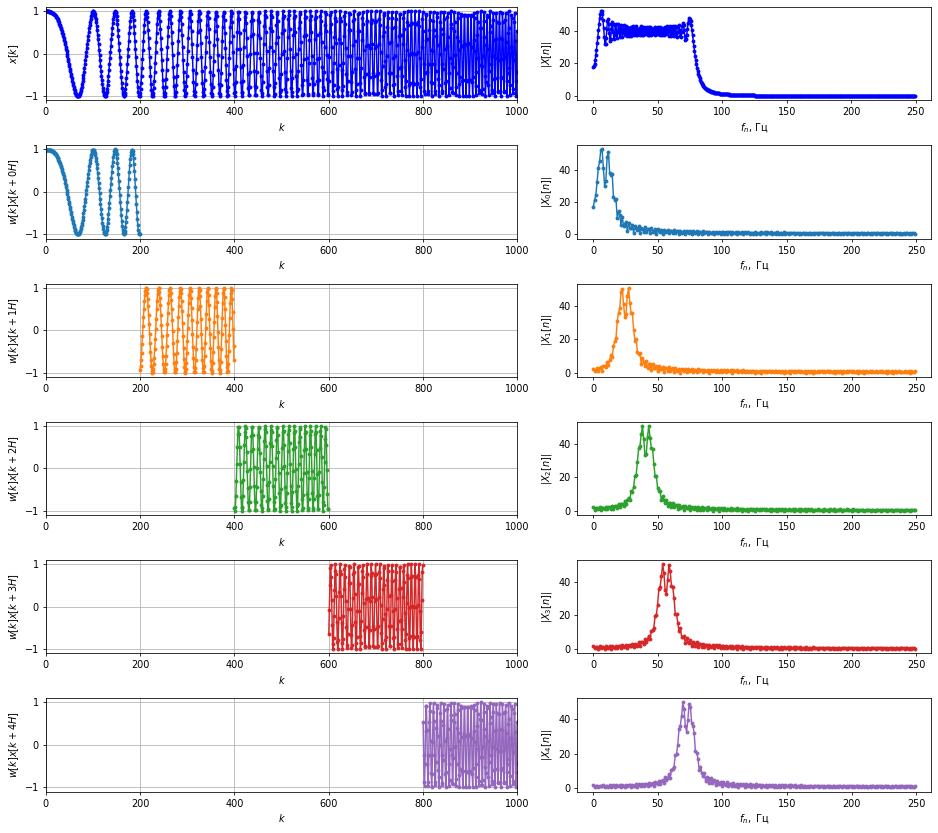

In [ ]:
plt.figure(figsize=[13.5, 12], dpi=70)
nseg=5
nperseg=200
noverlap=0
from matplotlib import gridspec
gs = gridspec.GridSpec(nseg+1, 2, width_ratios=[8, 6])

plt.subplot(gs[0])
plt.plot(np.arange(x.size), x, '.-b')
plt.xlim([0, x.size])
plt.tight_layout()
plt.grid()
plt.ylabel('$x[k]$')
plt.xlabel('$k$')

plt.subplot(gs[1])
X_n=np.fft.fft(x)
plt.plot(np.arange(X_n.size//2)*fs/X_n.size, abs(X_n[0:X_n.size//2]), '.-b')
plt.ylabel('$|X[n]|$')
plt.xlabel('$f_n$, Гц')

for u in range(nseg):
    plt.subplot(gs[u*2+2])
    y=x[(nperseg-noverlap)*u:(nperseg-noverlap)*u+nperseg]*signal.windows.boxcar(nperseg, sym=False)
    plt.plot(np.arange((nperseg-noverlap)*u, (nperseg-noverlap)*u+nperseg), y, '.-C%i' %u)
    plt.xlim([0, x.size])
    plt.ylabel('$w[k]x[k+%iH]$' %u)
    plt.xlabel('$k$')
    plt.grid()
    plt.yticks([-1, 0, 1])
    plt.tight_layout()
    
    plt.subplot(gs[u*2+3])
    X_n=np.fft.fft(y, 512)
    plt.plot(np.arange(X_n.size//2)*fs/X_n.size, abs(X_n[0:X_n.size//2]), '.-C%i'  %u)
    plt.ylabel('$|X_{%i}[n]|$' %u)
    plt.xlabel('$f_n,$ Гц')
    plt.tight_layout()

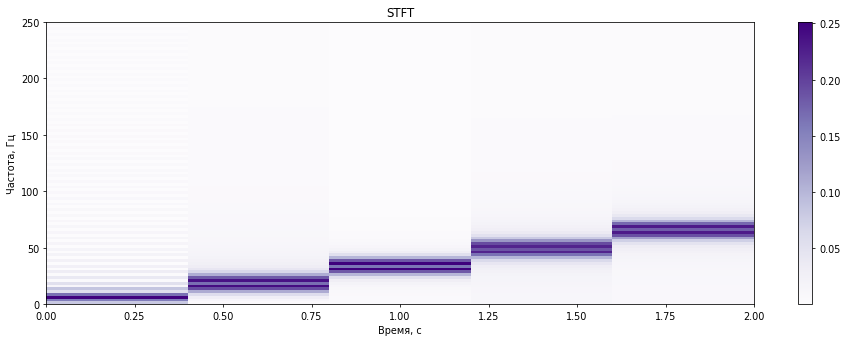

In [ ]:
f, t, Zxx = signal.stft(x, fs=fs, window=('boxcar'), nperseg=200, noverlap=0, nfft=200)
plt.figure(figsize=[13.5, 5], dpi=70)
plt.pcolormesh(t, f, np.abs(Zxx[:-1, :-1]), cmap=plt.get_cmap('Purples'), shading='flat')
plt.colorbar()
plt.title('STFT')
plt.ylabel('Частота, Гц')
plt.xlabel('Время, с')
plt.tight_layout()
plt.show()

Формирование спектрограммы  ЛЧМ - сигнала с перекрытием сегментов 50%. 

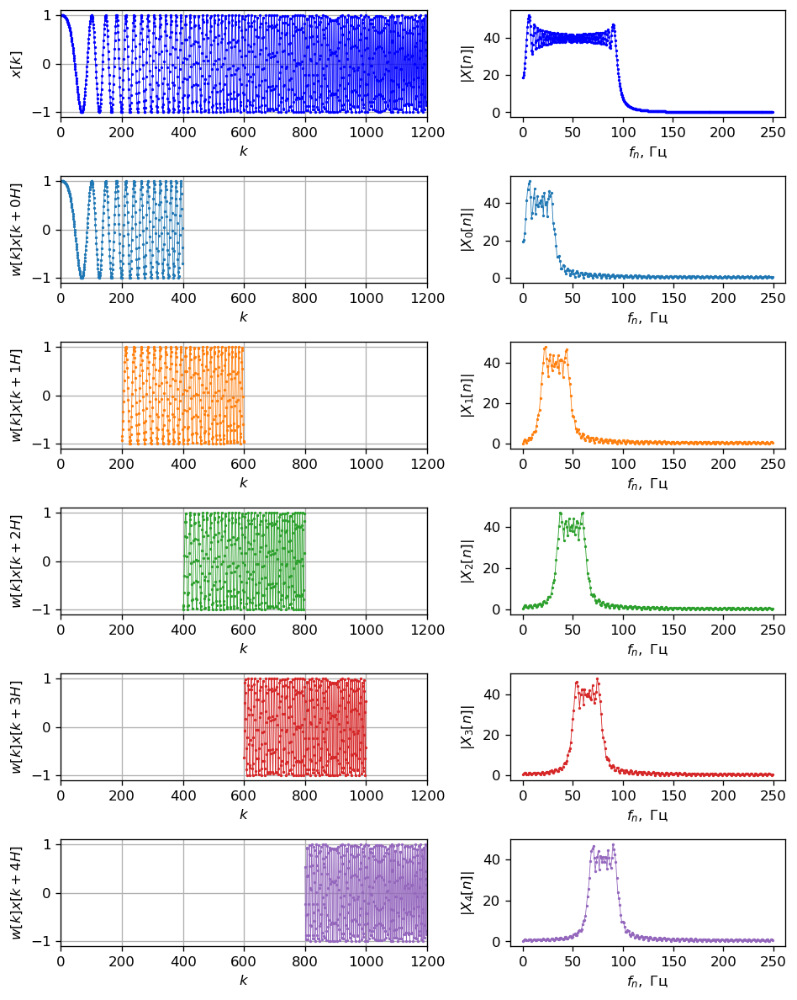

In [ ]:
plt.figure(figsize=[8, 10], dpi=120)
fs=500
f0=1
f1=80
t=np.arange(0, 2.4, 1/fs)
x = signal.chirp(t, f0=f0, f1=f1, t1=2, method='linear')

nseg=5
nperseg=400
noverlap=200
from matplotlib import gridspec
gs = gridspec.GridSpec(nseg+1, 2, width_ratios=[8, 6])
linewidth=0.5
ms=2
plt.subplot(gs[0])
plt.plot(np.arange(x.size), x, '.-b', linewidth=0.5, ms=ms)
plt.xlim([0, x.size])
plt.tight_layout()
plt.grid()
plt.ylabel('$x[k]$')
plt.xlabel('$k$')

plt.subplot(gs[1])
X_n=np.fft.fft(x)
plt.plot(np.arange(X_n.size//2)*fs/X_n.size, abs(X_n[0:X_n.size//2]), '.-b', linewidth=linewidth, ms=ms)
plt.ylabel('$|X[n]|$')
plt.xlabel('$f_n$, Гц')

for u in range(nseg):
    plt.subplot(gs[u*2+2])
    y=x[(nperseg-noverlap)*u:(nperseg-noverlap)*u+nperseg]*signal.windows.boxcar(nperseg, sym=False)
    plt.plot(np.arange((nperseg-noverlap)*u, (nperseg-noverlap)*u+nperseg), y, '.-C%i' %u, linewidth=linewidth, ms=ms)
    plt.xlim([0, x.size])
    plt.ylabel('$w[k]x[k+%iH]$' %u)
    plt.xlabel('$k$')
    plt.grid()
    plt.yticks([-1, 0, 1])
    plt.tight_layout()
    
    plt.subplot(gs[u*2+3])
    X_n=np.fft.fft(y, 512)
    plt.plot(np.arange(X_n.size//2)*fs/X_n.size, abs(X_n[0:X_n.size//2]), '.-C%i'  %u, linewidth=linewidth, ms=ms)
    plt.ylabel('$|X_{%i}[n]|$' %u)
    plt.xlabel('$f_n,$ Гц')
    plt.tight_layout()

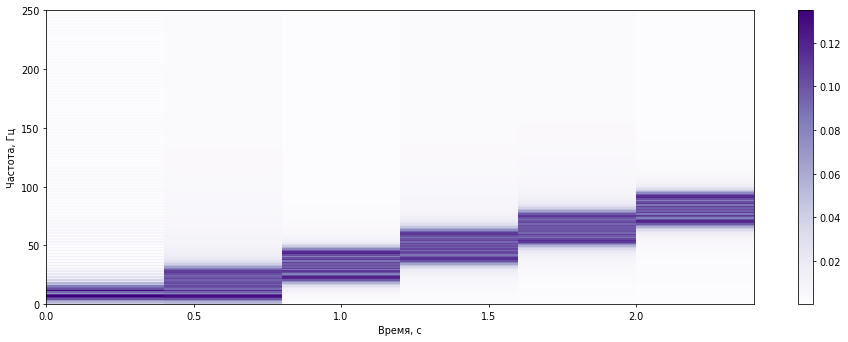

In [ ]:
f, t, Zxx = signal.stft(x, fs=fs, window=('boxcar'), nperseg=400, noverlap=200, nfft=400)
plt.figure(figsize=[13.5, 5], dpi=70)
plt.pcolormesh(t, f, np.abs(Zxx[:-1, :-1]), cmap=plt.get_cmap('Purples'), shading='flat')
plt.colorbar()
plt.ylabel('Частота, Гц')
plt.xlabel('Время, с')
plt.tight_layout()

### Пример. Влияние выбора окна. 

<>:30: SyntaxWarning: invalid escape sequence '\l'
<>:30: SyntaxWarning: invalid escape sequence '\l'
C:\Users\Skifv\AppData\Local\Temp\ipykernel_22688\2904255188.py:30: SyntaxWarning: invalid escape sequence '\l'
  plt.ylabel('$20 \lg \; |W(f)\; / \;W(0)|$, дБ')


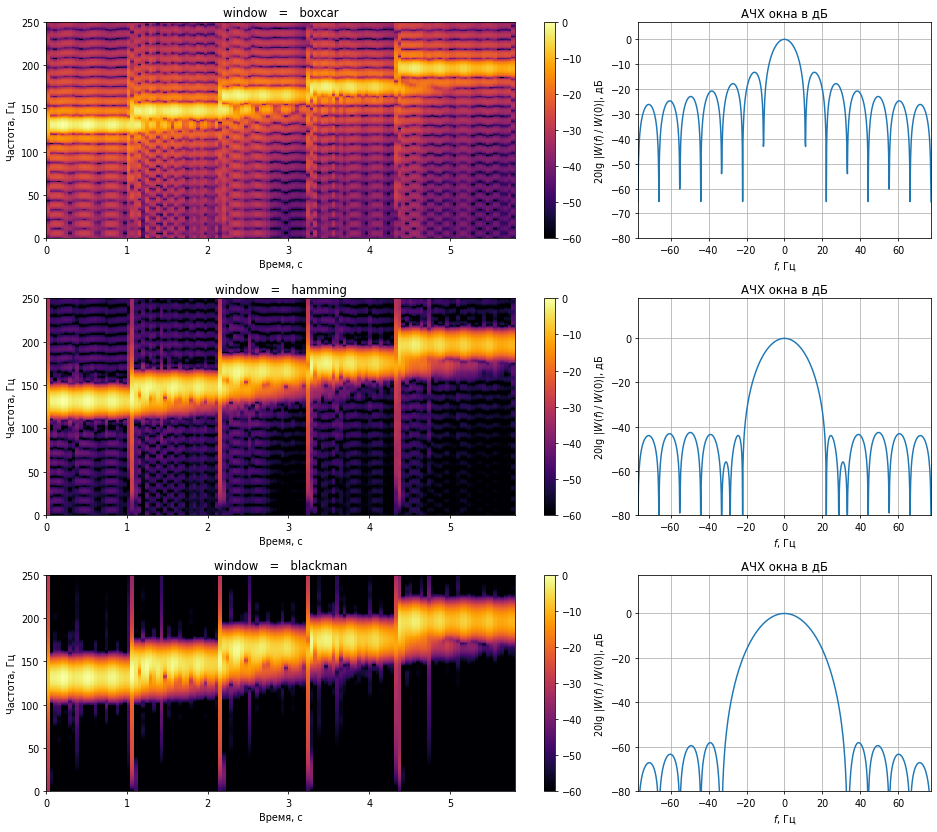

In [ ]:
import scipy.io.wavfile
fs, x = scipy.io.wavfile.read('dataset_lab3_/vibraphone-scale.wav')
x=x[:, 0]
N_dtft=2**18

windows=['boxcar', 'hamming', 'blackman']
gs = gridspec.GridSpec(len(windows), 2, width_ratios=[8, 4])
u=0
plt.figure(figsize=[13.5, 12], dpi=70)
for window in windows: #'bartlett', 'hann', 
    plt.subplot(gs[u*2], title='window   =   %s' % (window))
    nperseg=4000
    noverlap=nperseg//2
    f, t, Zxx = signal.stft(x, fs=fs, window=window, nperseg=nperseg, noverlap=noverlap, nfft=2**16)
    plt.pcolormesh(t, f,  20*np.log10(np.abs(Zxx[:-1, :-1])/np.max(abs(Zxx))), vmin=-60, cmap=plt.get_cmap('inferno'), shading='flat')
    plt.colorbar()
    plt.ylim((0, 250))
    plt.ylabel('Частота, Гц')
    plt.xlabel('Время, с')
    plt.tight_layout()
    plt.subplot(gs[u*2+1], title='АЧХ окна в дБ')
    w=signal.windows.get_window(window, Nx=nperseg)
    f, W = np.linspace(-fs/2, fs/2, num=N_dtft, endpoint=False), scipy.fft.fftshift(scipy.fft.fft(w, N_dtft))
    with np.errstate(divide='ignore'): # Отключаем RuntimeWarning
        plt.plot(f, 20*np.log10(abs(W)/max(abs(W))))
    plt.ylim(ymin=-80)
    plt.xlim([-7*fs/nperseg, 7*fs/nperseg])
    plt.grid()
    plt.xlabel('$f$, Гц')
    plt.ylabel('$20 \lg \; |W(f)\; / \;W(0)|$, дБ')
    plt.tight_layout()
    u+=1   

<>:30: SyntaxWarning: invalid escape sequence '\l'
<>:30: SyntaxWarning: invalid escape sequence '\l'
C:\Users\Skifv\AppData\Local\Temp\ipykernel_22688\837778541.py:30: SyntaxWarning: invalid escape sequence '\l'
  plt.ylabel('$20 \lg \; |W(f)\; / \;W(0)|$, дБ')


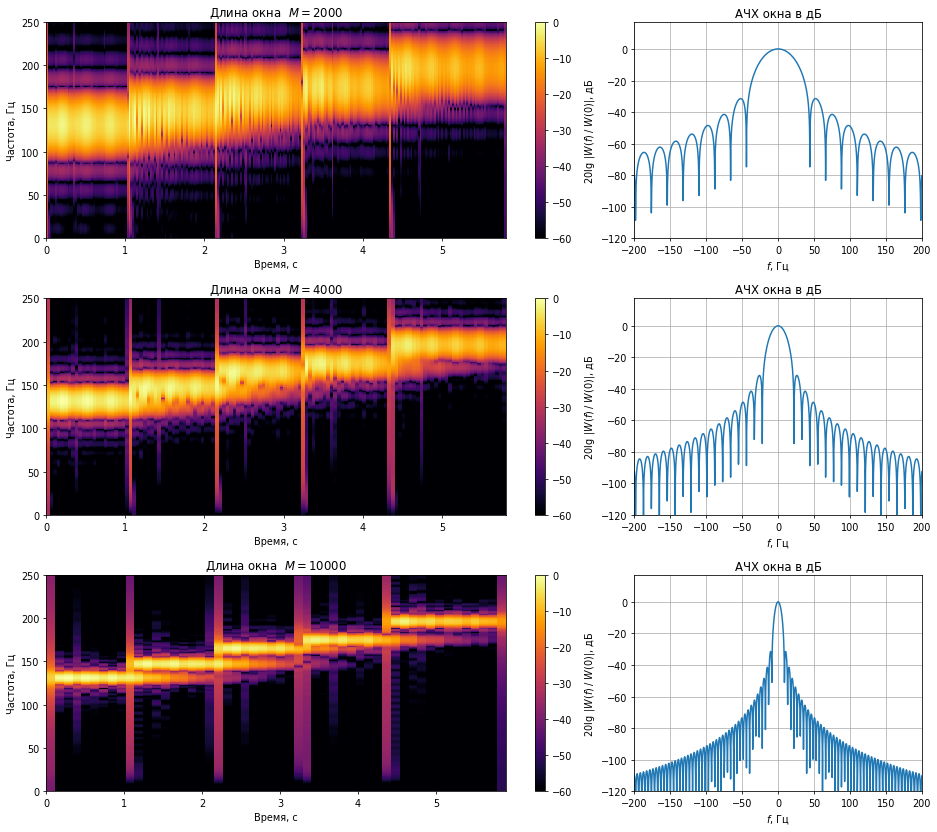

In [ ]:
import scipy.io.wavfile
fs, x = scipy.io.wavfile.read('dataset_lab3_/vibraphone-scale.wav')
x=x[:, 0]
N_dtft=2**18

window='hann'

gs = gridspec.GridSpec(len(windows), 2, width_ratios=[8, 4])
u=0
plt.figure(figsize=[13.5, 12], dpi=70)
for nperseg in [2000, 4000, 10000]: 
    plt.subplot(gs[u*2], title='Длина окна  $M=%s$' % (nperseg))
    noverlap=nperseg//2
    f, t, Zxx = signal.stft(x, fs=fs, window=window, nperseg=nperseg, noverlap=noverlap, nfft=2**16)
    plt.pcolormesh(t, f,  20*np.log10(np.abs(Zxx[:-1, :-1])/np.max(abs(Zxx))), vmin=-60, cmap=plt.get_cmap('inferno'), shading='flat')
    plt.colorbar()
    plt.ylim((0, 250))
    plt.ylabel('Частота, Гц')
    plt.xlabel('Время, с')
    plt.tight_layout()
    plt.subplot(gs[u*2+1], title='АЧХ окна в дБ')
    w=signal.windows.get_window(window, Nx=nperseg)
    f, W = np.linspace(-fs/2, fs/2, num=N_dtft, endpoint=False), scipy.fft.fftshift(scipy.fft.fft(w, N_dtft))
    with np.errstate(divide='ignore'): # Отключаем RuntimeWarning
        plt.plot(f, 20*np.log10(abs(W)/max(abs(W))))
    plt.ylim(ymin=-120)
    plt.xlim([-200, 200])
    plt.grid()
    plt.xlabel('$f$, Гц')
    plt.ylabel('$20 \lg \; |W(f)\; / \;W(0)|$, дБ')
    plt.tight_layout()
    u+=1   